# **Capstone Project-Covid19 Diagnosis**


---------------


## Project background

---------------


A novel coronavirus was swiftly identified as the cause of a new respiratory illness, whose first known case was reported in late November 2019. The COVID-19, caused by the SARS-CoV-2, was described by the World Health Organization (WHO) because the virus's unchallenged spread was declared a pandemic on March 11th, while the exponential rise in the number of cases threatened to overwhelm health systems worldwide with a demand for hospitalization and for ICU beds far above the capacity, with regions of Italy serving as notable examples.

Brazil reported the first SARS-CoV-2 case on February 26. After a quick transition from international to local and then community transmission, the federal authorities declared widespread community transmission on March 20. The county of So Paulo, which has a population of around 12 million and is home to Hospital Israelita Albert Einstein, has 477 confirmed cases and 30 linked deaths as of March 23. As of March 27, the state of So Paulo had 1,223 confirmed cases of COVID-19, with 68 related deaths.

In an attempt to stop the virus's spread throughout the nation and to reduce the number of serious hospitalizations, the state and county of So Paulo made the decision to enact quarantine and social segregation measures, which were implemented at least until early April. One of the reasons for this issue was the fact that testing every case with some mild symptoms, such as cold and cough or suffering from mild fever, would be impractical in the context of an overburdened health system with the potential limitation to performing tests for the detection of SARS-CoV-2, and test results could be delayed because of the increased number of people complaining about mild symptoms & going for test Therefore, it is crucial to make some recommendations to the hospital in acceptance of patient into hospital. Setting up requirements for testing was crucial in order to concentrate on receiving test results quickly and also to stop the virus's spread as soon as possible.

## **Problems you want to find answers**


1) Based on the laboratory tests collected from the suspected cases, improve a classification model that predicts the chances of being positive/negative for covid19 

2) What features could influence in the acceptance of patient into hospital?


-----------------------

## **Objective**


* Pre-processing and missing data analysis.
* Exploratory Data Analysis, Data Wrangling and visualize the dataset.
* Predict the likelihood of testing positive or negative for COVID19 and the variables that may affect it based on the laboratory tests that were gathered from the suspected cases.
* Also, provide the recommendations to the hospital on how they can better manage the admission of patients to the
general ward, semi-intensive unit, or intensive care unit.

## **Importing the necessary libraries**

In [2]:
import warnings                                            # Used to ignore the warning given as output of the code 
warnings.filterwarnings('ignore')


import numpy as np                               # Basic libraries of python for numeric and dataframe computations
import pandas as pd

import matplotlib.pyplot as plt                            # Basic library for data visualization
import seaborn as sns                                      # Slightly advanced library for data visualization
import plotly.graph_objs as go                             # More advanced library for data visualization
from sklearn.model_selection import train_test_split       # Used to split the data into train and test sets
from plotly.offline import iplot, init_notebook_mode

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


### **Read the dataset**
Reading the data to explore and understand it

In [3]:
df= pd.read_excel("covid19_dataset.xlsx")

print(f"There are { df.shape[0]} rows and {df.shape[1]} columns.")  # f-string

There are 5644 rows and 111 columns.


In [4]:
df.head()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,...,Hb saturation (arterial blood gases),pCO2 (arterial blood gas analysis),Base excess (arterial blood gas analysis),pH (arterial blood gas analysis),Total CO2 (arterial blood gas analysis),HCO3 (arterial blood gas analysis),pO2 (arterial blood gas analysis),Arteiral Fio2,Phosphor,ctO2 (arterial blood gas analysis)
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7d619a94f97c45,5,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,d9e41465789c2b5,15,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
df.tail()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,...,Hb saturation (arterial blood gases),pCO2 (arterial blood gas analysis),Base excess (arterial blood gas analysis),pH (arterial blood gas analysis),Total CO2 (arterial blood gas analysis),HCO3 (arterial blood gas analysis),pO2 (arterial blood gas analysis),Arteiral Fio2,Phosphor,ctO2 (arterial blood gas analysis)
5639,ae66feb9e4dc3a0,3,positive,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5640,517c2834024f3ea,17,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5641,5c57d6037fe266d,4,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5642,c20c44766f28291,10,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5643,2697fdccbfeb7f7,19,positive,0,0,0,0.694287,0.541564,-0.906829,-0.325903,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
# Drop unused columns

df.drop('Patient ID' , axis=1, inplace= True)

- `Patient ID` is just an index for the data entry. In all likelihood, this column will not be a significant factor 

In [7]:
# Drop the columns where all elements are missing.
df=df.dropna(how='all', axis=1)

- `Empty` columns are removed as these columns will not be a factor at all. 

In [8]:
# It is best to write column names in lower case and leave no space between them so that users may select features with easily.

columns=[]
for column in df.columns:
    columns.append(column.lower().replace(' ','_'))
    
# Assign the new columns into current data frame.
df.columns = columns

In [9]:
# Check the column names
df.head()

,patient_age_quantile,sars-cov-2_exam_result,"patient_addmited_to_regular_ward_(1=yes,_0=no)","patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)","patient_addmited_to_intensive_care_unit_(1=yes,_0=no)",hematocrit,hemoglobin,platelets,mean_platelet_volume_,red_blood_cells,...,hb_saturation_(arterial_blood_gases),pco2_(arterial_blood_gas_analysis),base_excess_(arterial_blood_gas_analysis),ph_(arterial_blood_gas_analysis),total_co2_(arterial_blood_gas_analysis),hco3_(arterial_blood_gas_analysis),po2_(arterial_blood_gas_analysis),arteiral_fio2,phosphor,cto2_(arterial_blood_gas_analysis)
0,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,0.102004,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,15,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


- There were 6 empty columns. They were removed.

Let's check **info** of the data.

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5644 entries, 0 to 5643
Columns: 105 entries, patient_age_quantile to cto2_(arterial_blood_gas_analysis)
dtypes: float64(65), int64(4), object(36)
memory usage: 4.5+ MB


# Data pre-processing

Distribution and spread for every continuous attribute, distribution of data in categories for categorical ones

Therefore, dataframe has to be defined as categorical attribute and continuous attribute


In [11]:
# We first need to look at the categorical attributes.
categ = []
# Loop to evaluate if it's categorical

for i in df.columns:
    if len(df[i].unique()) <= 5 :
        categ.append(i)
        
print(categ)
len(categ)

['sars-cov-2_exam_result', 'patient_addmited_to_regular_ward_(1=yes,_0=no)', 'patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)', 'patient_addmited_to_intensive_care_unit_(1=yes,_0=no)', 'respiratory_syncytial_virus', 'influenza_a', 'influenza_b', 'parainfluenza_1', 'coronavirusnl63', 'rhinovirus/enterovirus', 'coronavirus_hku1', 'parainfluenza_3', 'chlamydophila_pneumoniae', 'adenovirus', 'parainfluenza_4', 'coronavirus229e', 'coronavirusoc43', 'inf_a_h1n1_2009', 'bordetella_pertussis', 'metapneumovirus', 'parainfluenza_2', 'influenza_b,_rapid_test', 'influenza_a,_rapid_test', 'strepto_a', 'fio2_(venous_blood_gas_analysis)', 'promyelocytes', 'metamyelocytes', 'myelocytes', 'myeloblasts', 'urine_-_esterase', 'urine_-_aspect', 'urine_-_hemoglobin', 'urine_-_bile_pigments', 'urine_-_ketone_bodies', 'urine_-_nitrite', 'urine_-_urobilinogen', 'urine_-_protein', 'urine_-_hyaline_cylinders', 'urine_-_granular_cylinders', 'urine_-_yeasts', 'urine_-_color', 'vitamin_b12']


42

In [12]:
# Evaluate categories for all discrete features

categ1= categ[1:20]
for i in categ1:
    print(i,' - ', df[i].unique())

    

patient_addmited_to_regular_ward_(1=yes,_0=no)  -  [0 1]
patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)  -  [0 1]
patient_addmited_to_intensive_care_unit_(1=yes,_0=no)  -  [0 1]
respiratory_syncytial_virus  -  [nan 'not_detected' 'detected']
influenza_a  -  [nan 'not_detected' 'detected']
influenza_b  -  [nan 'not_detected' 'detected']
parainfluenza_1  -  [nan 'not_detected' 'detected']
coronavirusnl63  -  [nan 'not_detected' 'detected']
rhinovirus/enterovirus  -  [nan 'detected' 'not_detected']
coronavirus_hku1  -  [nan 'not_detected' 'detected']
parainfluenza_3  -  [nan 'not_detected' 'detected']
chlamydophila_pneumoniae  -  [nan 'not_detected' 'detected']
adenovirus  -  [nan 'not_detected' 'detected']
parainfluenza_4  -  [nan 'not_detected' 'detected']
coronavirus229e  -  [nan 'not_detected' 'detected']
coronavirusoc43  -  [nan 'not_detected' 'detected']
inf_a_h1n1_2009  -  [nan 'not_detected' 'detected']
bordetella_pertussis  -  [nan 'not_detected' 'detected']
metapneumoviru

In [13]:
# Evaluate categories for all discrete features--BUNU  MURAT BEYE SORALIM
categ1= categ[20:len(categ)]
for i in categ1:
    print(i,' - ', df[i].unique())


parainfluenza_2  -  [nan 'not_detected']
influenza_b,_rapid_test  -  [nan 'negative' 'positive']
influenza_a,_rapid_test  -  [nan 'negative' 'positive']
strepto_a  -  [nan 'positive' 'negative' 'not_done']
fio2_(venous_blood_gas_analysis)  -  [nan  0.]
promyelocytes  -  [        nan -0.10206207  9.79795933]
metamyelocytes  -  [        nan -0.31596529  2.91020679  1.29712069  6.13637877]
myelocytes  -  [        nan -0.23312619  2.028198    4.28952217  6.55084658]
myeloblasts  -  [nan  0.]
urine_-_esterase  -  [nan 'absent' 'not_done']
urine_-_aspect  -  [nan 'clear' 'cloudy' 'altered_coloring' 'lightly_cloudy']
urine_-_hemoglobin  -  [nan 'absent' 'present' 'not_done']
urine_-_bile_pigments  -  [nan 'absent' 'not_done']
urine_-_ketone_bodies  -  [nan 'absent' 'not_done']
urine_-_nitrite  -  [nan 'not_done']
urine_-_urobilinogen  -  [nan 'normal' 'not_done']
urine_-_protein  -  [nan 'absent' 'not_done']
urine_-_hyaline_cylinders  -  [nan 'absent']
urine_-_granular_cylinders  -  [nan 'abs

####  Drop some values due to having only one category.
- parainfluenza_2, fio2_(venous_blood_gas_analysis), myeloblasts, urine_-_nitrite, urine_-_hyaline_cylinders, urine_-_granular_cylinders and urine_-_yeasts has only one category besides the NaN category.

In [14]:
# Now we will create a new dataframe and look at the missing values in it. 
df1= df[categ]
df1.head()

,sars-cov-2_exam_result,"patient_addmited_to_regular_ward_(1=yes,_0=no)","patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)","patient_addmited_to_intensive_care_unit_(1=yes,_0=no)",respiratory_syncytial_virus,influenza_a,influenza_b,parainfluenza_1,coronavirusnl63,rhinovirus/enterovirus,...,urine_-_bile_pigments,urine_-_ketone_bodies,urine_-_nitrite,urine_-_urobilinogen,urine_-_protein,urine_-_hyaline_cylinders,urine_-_granular_cylinders,urine_-_yeasts,urine_-_color,vitamin_b12
0,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,negative,0,0,0,not_detected,not_detected,not_detected,not_detected,not_detected,detected,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,negative,0,0,0,not_detected,not_detected,not_detected,not_detected,not_detected,detected,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
# Drop these columns because they will have no effect on dependent variable. 
features_to_be_dropped = ['parainfluenza_2','fio2_(venous_blood_gas_analysis)','myeloblasts', 
'urine_-_nitrite','urine_-_hyaline_cylinders','urine_-_granular_cylinders','urine_-_yeasts']
df1.drop(features_to_be_dropped, axis=1, inplace=True)

In [16]:
df1.head()

,sars-cov-2_exam_result,"patient_addmited_to_regular_ward_(1=yes,_0=no)","patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)","patient_addmited_to_intensive_care_unit_(1=yes,_0=no)",respiratory_syncytial_virus,influenza_a,influenza_b,parainfluenza_1,coronavirusnl63,rhinovirus/enterovirus,...,myelocytes,urine_-_esterase,urine_-_aspect,urine_-_hemoglobin,urine_-_bile_pigments,urine_-_ketone_bodies,urine_-_urobilinogen,urine_-_protein,urine_-_color,vitamin_b12
0,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,negative,0,0,0,not_detected,not_detected,not_detected,not_detected,not_detected,detected,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,negative,0,0,0,not_detected,not_detected,not_detected,not_detected,not_detected,detected,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
# Checking missing values
df1.isnull().sum()

sars-cov-2_exam_result                                      0
patient_addmited_to_regular_ward_(1=yes,_0=no)              0
patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)       0
patient_addmited_to_intensive_care_unit_(1=yes,_0=no)       0
respiratory_syncytial_virus                              4290
influenza_a                                              4290
influenza_b                                              4290
parainfluenza_1                                          4292
coronavirusnl63                                          4292
rhinovirus/enterovirus                                   4292
coronavirus_hku1                                         4292
parainfluenza_3                                          4292
chlamydophila_pneumoniae                                 4292
adenovirus                                               4292
parainfluenza_4                                          4292
coronavirus229e                                          4292
coronavi

In [18]:
percent_missing = df1.isnull().sum() * 100 / len(df1)

missing_value_df1 = pd.DataFrame({'column_name': df1.columns,
                                 'percent_missing': percent_missing})

missing_value_df1.sort_values('percent_missing', inplace=True) 

missing_value_df1.head(50)      

,column_name,percent_missing
sars-cov-2_exam_result,sars-cov-2_exam_result,0.000000
"patient_addmited_to_regular_ward_(1=yes,_0=no)","patient_addmited_to_regular_ward_(1=yes,_0=no)",0.000000
"patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)",patient_addmited_to_semi-intensive_unit_(1=yes...,0.000000
"patient_addmited_to_intensive_care_unit_(1=yes,_0=no)",patient_addmited_to_intensive_care_unit_(1=yes...,0.000000
respiratory_syncytial_virus,respiratory_syncytial_virus,76.009922
influenza_a,influenza_a,76.009922
influenza_b,influenza_b,76.009922
metapneumovirus,metapneumovirus,76.045358
bordetella_pertussis,bordetella_pertussis,76.045358
coronavirusoc43,coronavirusoc43,76.045358


It is evident that there are several missing values, ranging from %76 to %100. I'll remove the numbers that have missing values more than 90% for the time being.

In [19]:
df1_new = missing_value_df1[missing_value_df1["percent_missing"] >90]
df1_new["column_name"]
list(df1_new.column_name)

['strepto_a',
 'myelocytes',
 'metamyelocytes',
 'promyelocytes',
 'urine_-_color',
 'urine_-_aspect',
 'urine_-_hemoglobin',
 'urine_-_bile_pigments',
 'urine_-_urobilinogen',
 'urine_-_esterase',
 'urine_-_protein',
 'urine_-_ketone_bodies',
 'vitamin_b12']

In [20]:
# Drop the columns which has missing values more than %90.

df1.drop(list(df1_new.column_name), axis=1, inplace=True)

In [21]:
df1.head()

,sars-cov-2_exam_result,"patient_addmited_to_regular_ward_(1=yes,_0=no)","patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)","patient_addmited_to_intensive_care_unit_(1=yes,_0=no)",respiratory_syncytial_virus,influenza_a,influenza_b,parainfluenza_1,coronavirusnl63,rhinovirus/enterovirus,...,chlamydophila_pneumoniae,adenovirus,parainfluenza_4,coronavirus229e,coronavirusoc43,inf_a_h1n1_2009,bordetella_pertussis,metapneumovirus,"influenza_b,_rapid_test","influenza_a,_rapid_test"
0,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,negative,0,0,0,not_detected,not_detected,not_detected,not_detected,not_detected,detected,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,negative,0,0,0,not_detected,not_detected,not_detected,not_detected,not_detected,detected,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN


## **Exploratory Data Analysis (Discrete Features)**

<Axes: xlabel='count', ylabel='sars-cov-2_exam_result'>

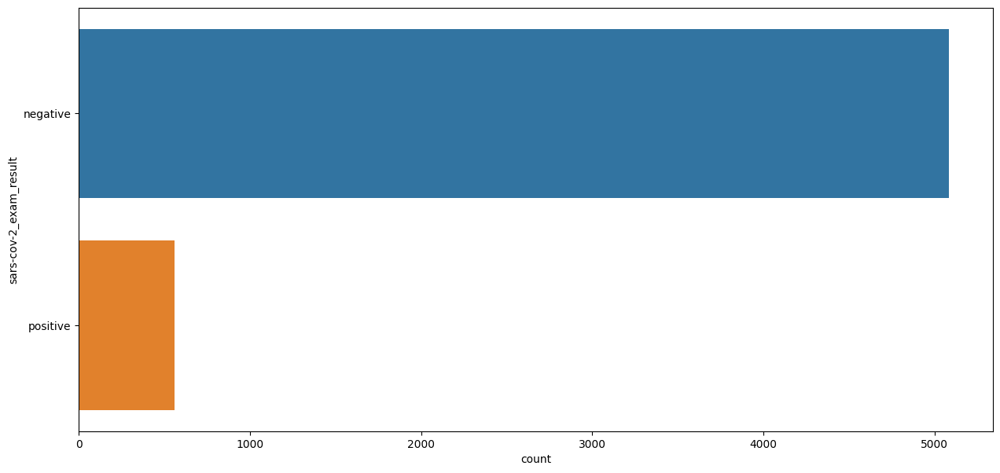

In [22]:
# Analyze the number of cases of COVID that have been reported, both positive and negative.

plt.figure(figsize = (15, 7))
sns.countplot(y = "sars-cov-2_exam_result", data = df, order = df["sars-cov-2_exam_result"].value_counts().index[0:30])

In [23]:
df["sars-cov-2_exam_result"].value_counts()

sars-cov-2_exam_result
negative    5086
positive     558
Name: count, dtype: int64

<Axes: xlabel='count', ylabel='patient_addmited_to_regular_ward_(1=yes,_0=no)'>

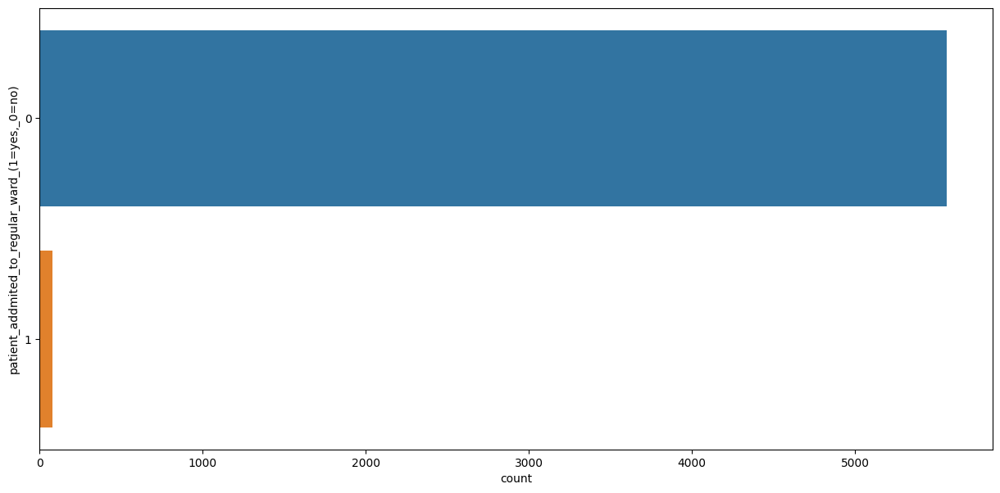

In [24]:
#Analyze how many patient admitted to regular ward 

plt.figure(figsize = (15,7))

sns.countplot(y = "patient_addmited_to_regular_ward_(1=yes,_0=no)", data = df, order = df["patient_addmited_to_regular_ward_(1=yes,_0=no)"].value_counts().index[0:30])

In [25]:
df["patient_addmited_to_regular_ward_(1=yes,_0=no)"].value_counts()

patient_addmited_to_regular_ward_(1=yes,_0=no)
0    5565
1      79
Name: count, dtype: int64

### **Check the distribution of the variables**

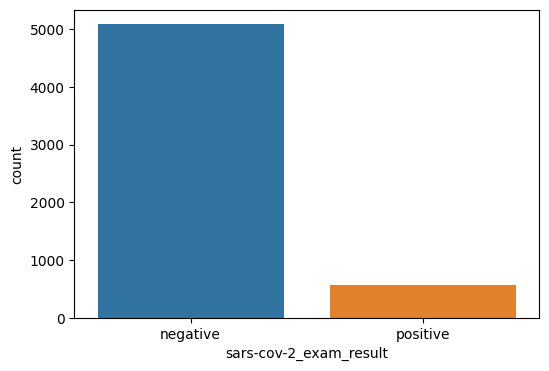

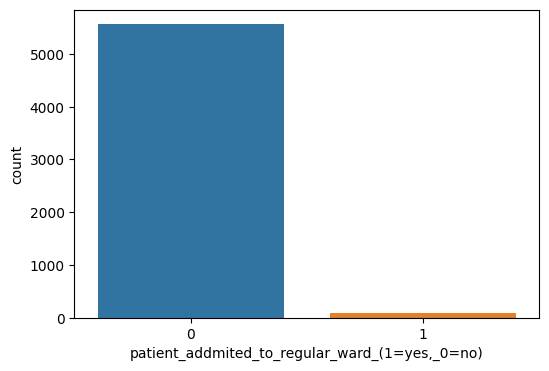

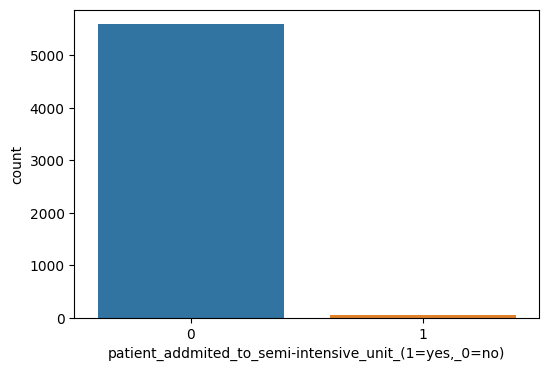

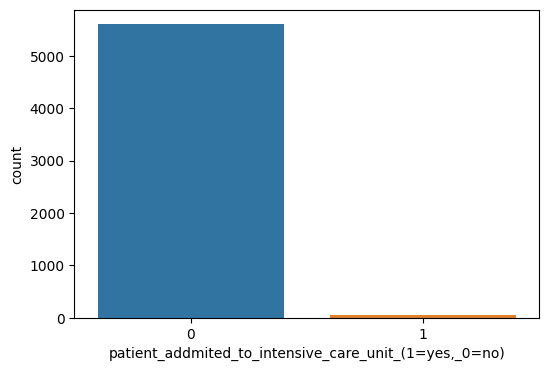

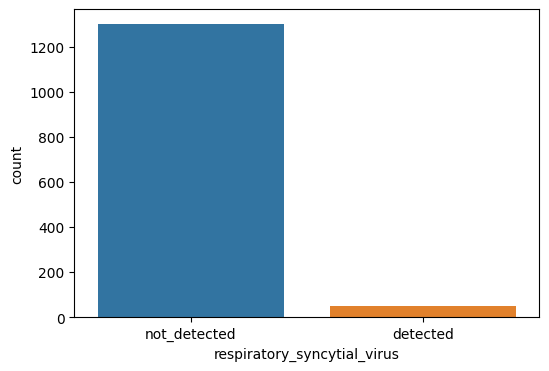

...

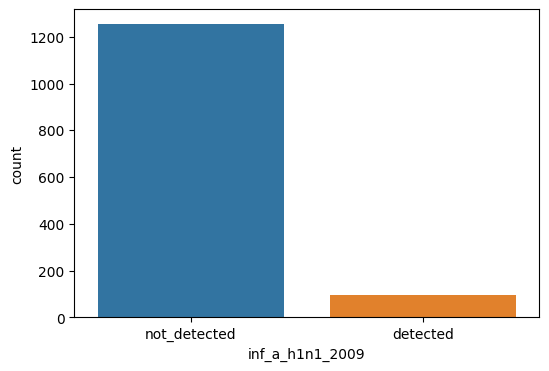

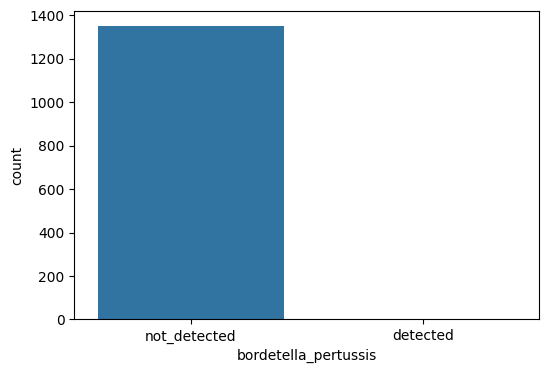

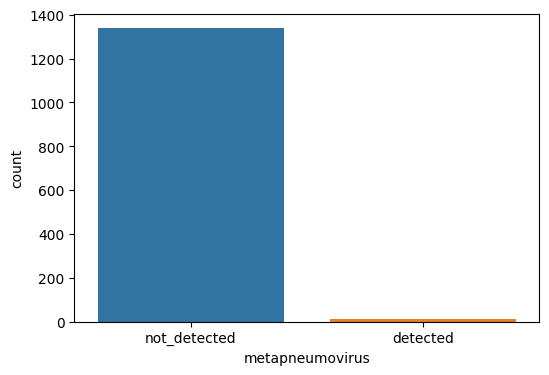

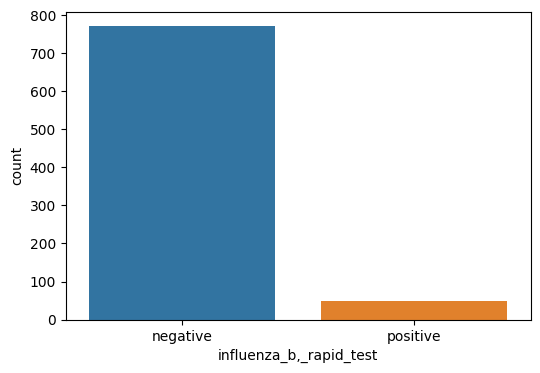

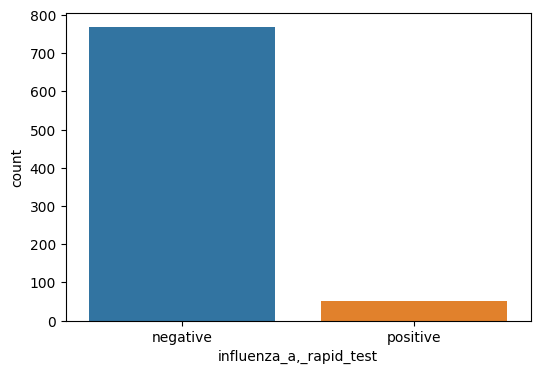

In [26]:
# let's plot all the columns to look at their distributions

for i in df1.columns:
    plt.figure(figsize=(6,4))
    sns.countplot(data=df,x=i)
    plt.show()

* Ratio of positive cases changed by each feature. 
* However, it is almost none in the bordetella and parafiluenza 1. 
* The distribution of rhinoviruses and enteroviruses between the two groups is "relatively" more equal.
* Negative cases dominate significantly for other categories.

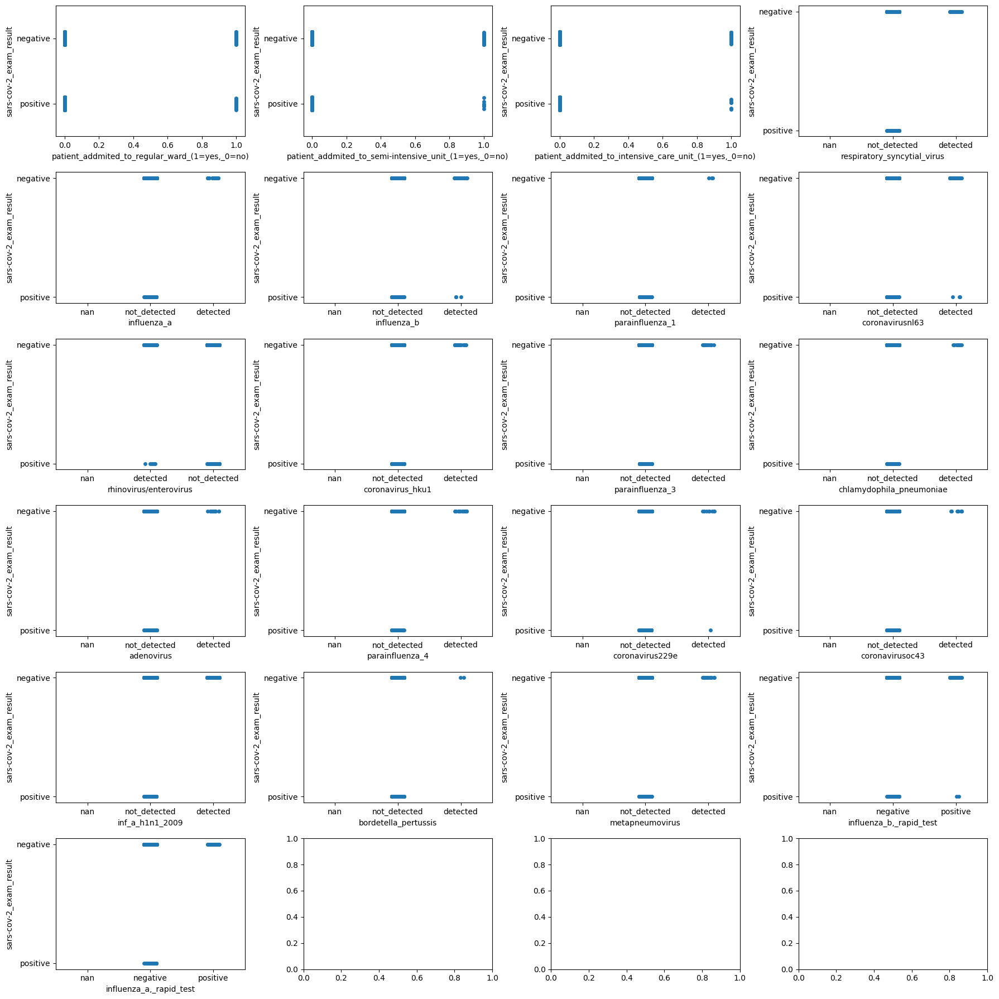

In [27]:
# To observe the relationship between categorical values and the Sars-cov2 result, first create a stripplot.

fig, axes = plt.subplots(nrows=6, ncols=4, figsize=(18,18))
row=0  #index row
column= 0 # index column

for i in df1.columns:
    if not i == 'sars-cov-2_exam_result':
        sns.stripplot(x=i, y= 'sars-cov-2_exam_result', data=df1, ax=axes[row][column])
        column+= 1
        if column > 3:
            column=0
            row+=1
plt.tight_layout()

In [28]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5644 entries, 0 to 5643
Data columns (total 22 columns):
 #   Column                                                 Non-Null Count  Dtype 
---  ------                                                 --------------  ----- 
 0   sars-cov-2_exam_result                                 5644 non-null   object
 1   patient_addmited_to_regular_ward_(1=yes,_0=no)         5644 non-null   int64 
 2   patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)  5644 non-null   int64 
 3   patient_addmited_to_intensive_care_unit_(1=yes,_0=no)  5644 non-null   int64 
 4   respiratory_syncytial_virus                            1354 non-null   object
 5   influenza_a                                            1354 non-null   object
 6   influenza_b                                            1354 non-null   object
 7   parainfluenza_1                                        1352 non-null   object
 8   coronavirusnl63                                        135

This plot gives a great idea of which attributes are associated with positive sars-cov-2_exam_result.

As an example, COVID results were invariably negative when some attributes such as the influenza_a, metapneumovirus, parainfluenza and adenovirus test were positive. These characteristics may serve as excellent indicators of a patient's absence of a COVID positive case.

In [29]:
# Analyze the continuous attributes.

list(set(df.columns)- set(df1.columns))

['urine_-_bile_pigments',
 'urine_-_red_blood_cells',
 'lactic_dehydrogenase',
 'mean_corpuscular_hemoglobin_(mch)',
 'po2_(arterial_blood_gas_analysis)',
 'urine_-_nitrite',
 'total_co2_(venous_blood_gas_analysis)',
 'po2_(venous_blood_gas_analysis)',
 'arteiral_fio2',
 'ph_(arterial_blood_gas_analysis)',
 'indirect_bilirubin',
 'urine_-_leukocytes',
 'sodium',
 'ionized_calcium\xa0',
 'myelocytes',
 'segmented',
 'alanine_transaminase',
 'lipase_dosage',
 'promyelocytes',
 'alkaline_phosphatase',
 'hb_saturation_(venous_blood_gas_analysis)',
 'total_co2_(arterial_blood_gas_analysis)',
 'urine_-_hyaline_cylinders',
 'direct_bilirubin',
 'pco2_(venous_blood_gas_analysis)',
 'fio2_(venous_blood_gas_analysis)',
 'patient_age_quantile',
 'proteina_c_reativa_mg/dl',
 'eosinophils',
 'aspartate_transaminase',
 'vitamin_b12',
 'strepto_a',
 'urine_-_protein',
 'leukocytes',
 'urine_-_color',
 'pco2_(arterial_blood_gas_analysis)',
 'cto2_(arterial_blood_gas_analysis)',
 'mean_corpuscular_volu

In [30]:
# Look at the continious features.

columns = list(set(df.columns) - set(df1.columns))
df2 = df[columns]
df2.drop(features_to_be_dropped, axis=1,inplace=True)
df2.head()

,urine_-_bile_pigments,urine_-_red_blood_cells,lactic_dehydrogenase,mean_corpuscular_hemoglobin_(mch),po2_(arterial_blood_gas_analysis),total_co2_(venous_blood_gas_analysis),po2_(venous_blood_gas_analysis),arteiral_fio2,ph_(arterial_blood_gas_analysis),indirect_bilirubin,...,lymphocytes,hematocrit,ph_(venous_blood_gas_analysis),urine_-_hemoglobin,creatine_phosphokinase (cpk),neutrophils,mean_platelet_volume_,basophils,monocytes,arterial_lactic_acid
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,-0.292269,NaN,NaN,NaN,NaN,NaN,NaN,...,0.318366,0.236515,NaN,NaN,NaN,-0.619086,0.010677,-0.223767,0.357547,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [31]:
# Basic summary stats - Continuous  Features
df2.describe().T

,count,mean,std,min,25%,50%,75%,max
urine_-_red_blood_cells,70.0,7.557017e-09,1.007220,-0.202297,-0.202297,-0.193921,-0.166071,7.821993
lactic_dehydrogenase,101.0,1.733551e-09,1.004988,-1.358584,-0.699774,-0.330840,0.472908,2.950035
mean_corpuscular_hemoglobin_(mch),602.0,-3.453010e-09,1.000832,-5.937604,-0.501356,0.125903,0.596348,4.098546
po2_(arterial_blood_gas_analysis),27.0,-2.469729e-08,1.019049,-1.175907,-0.816990,-0.159955,0.450009,2.205371
total_co2_(venous_blood_gas_analysis),136.0,-9.121483e-09,1.003697,-2.598133,-0.494700,0.104088,0.541664,3.021258
...,...,...,...,...,...,...,...,...
neutrophils,513.0,5.908361e-09,1.000976,-3.339775,-0.651866,-0.053642,0.683894,2.535929
mean_platelet_volume_,599.0,7.438142e-09,1.000836,-2.457575,-0.662483,-0.101517,0.683835,3.713052
basophils,602.0,-6.633739e-09,1.000832,-1.140144,-0.529226,-0.223767,0.387152,11.078219
monocytes,601.0,-3.220114e-09,1.000833,-2.163721,-0.614192,-0.115191,0.488863,4.533397


In [32]:
# Checking missing values
df2.isnull().sum()

urine_-_bile_pigments                5574
urine_-_red_blood_cells              5574
lactic_dehydrogenase                 5543
mean_corpuscular_hemoglobin_(mch)    5042
po2_(arterial_blood_gas_analysis)    5617
                                     ... 
neutrophils                          5131
mean_platelet_volume_                5045
basophils                            5042
monocytes                            5043
arterial_lactic_acid                 5617
Length: 76, dtype: int64

In [33]:
percent_missing = df2.isnull().sum() * 100 / len(df2)

missing_value_df2 = pd.DataFrame({'column_name': df2.columns,
                                 'percent_missing': percent_missing})

missing_value_df2.sort_values('percent_missing', inplace=True) 

missing_value_df2.head(50)      

,column_name,percent_missing
patient_age_quantile,patient_age_quantile,0.000000
hemoglobin,hemoglobin,89.316088
hematocrit,hematocrit,89.316088
lymphocytes,lymphocytes,89.333806
basophils,basophils,89.333806
mean_corpuscular_hemoglobin_(mch),mean_corpuscular_hemoglobin_(mch),89.333806
platelets,platelets,89.333806
red_blood_cells,red_blood_cells,89.333806
eosinophils,eosinophils,89.333806
mean_corpuscular_hemoglobin_concentration (mchc),mean_corpuscular_hemoglobin_concentration (mchc),89.333806


It is clear that there are a number of values missing, ranging from %89 to %100. For the time being, I'll eliminate the numbers that have missing values in excess of 90%. As a result, 15 columns were left.

In [34]:
df2_new = missing_value_df2[missing_value_df2["percent_missing"] > 90]
df2_new["column_name"]
list(df2_new.column_name)
df2.drop(list(df2_new.column_name), axis=1, inplace=True)

<Axes: xlabel='patient_age_quantile', ylabel='Density'>

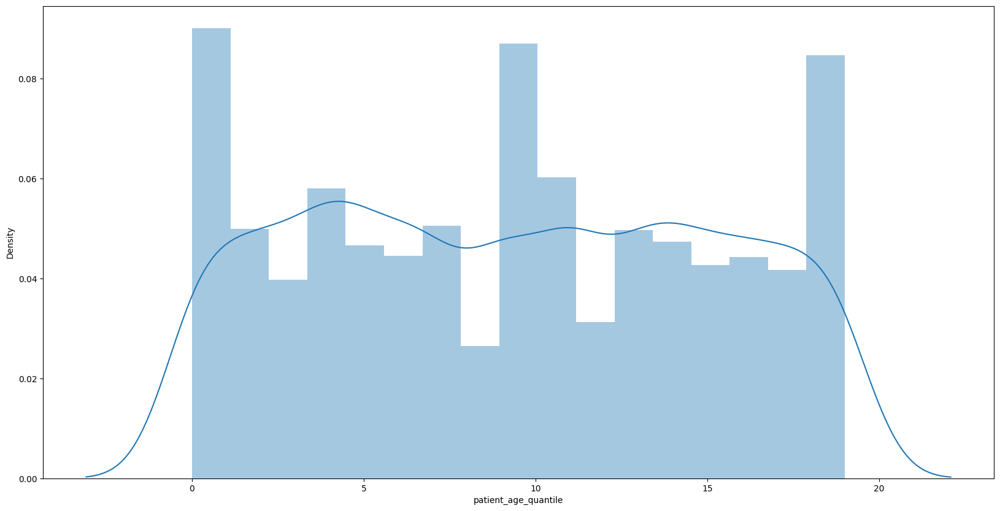

In [35]:
plt.figure(figsize = (20,10))
sns.distplot(df2["patient_age_quantile"])

In [37]:
trace0 = go.Box(y = df2["patient_age_quantile"],
               boxpoints = "all",
               jitter = 0.3,
               pointpos = -1.5,
               boxmean = "sd")
data = [trace0]
iplot({"data":data})

* In the patient age quantile, the Median is 9 and the mean is 9.31 +/ 5.77. There seem to be no outliers at this point.

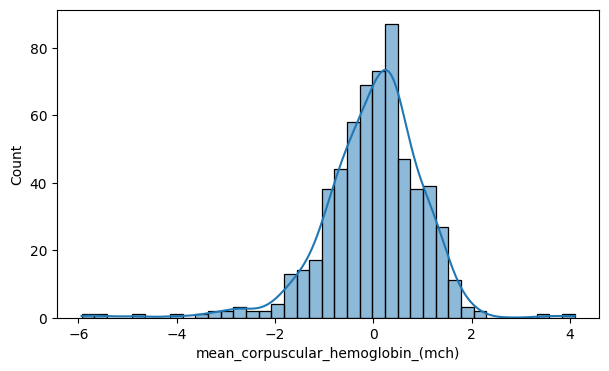

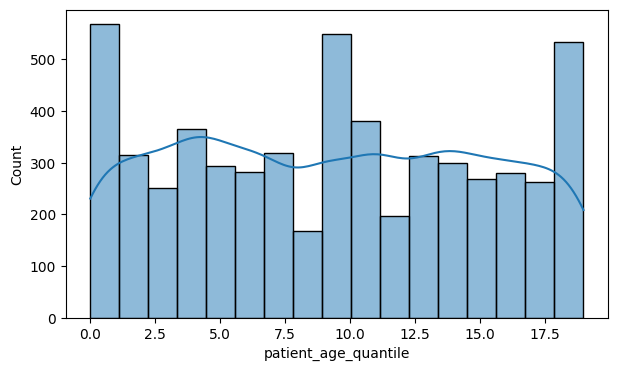

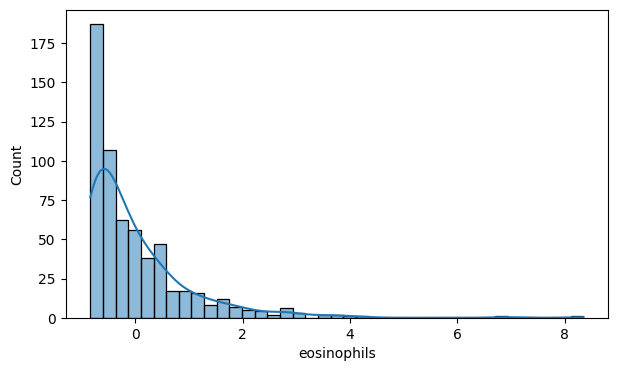

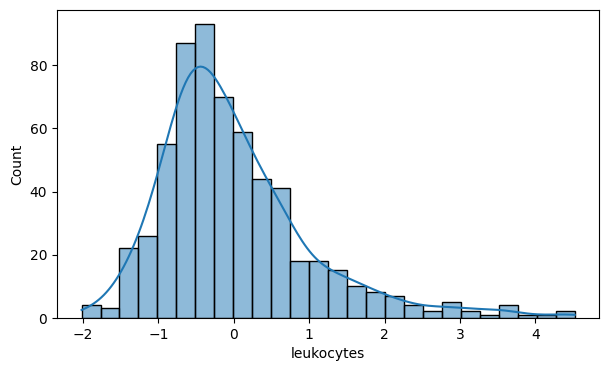

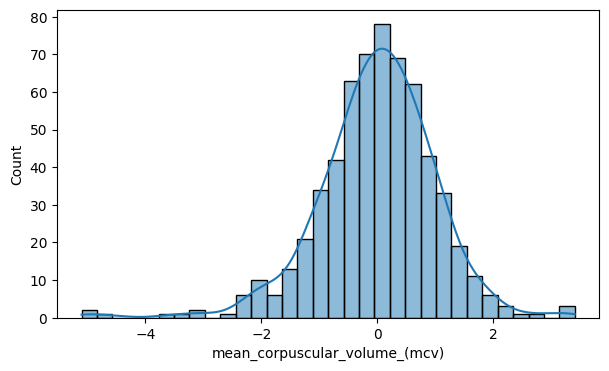

...

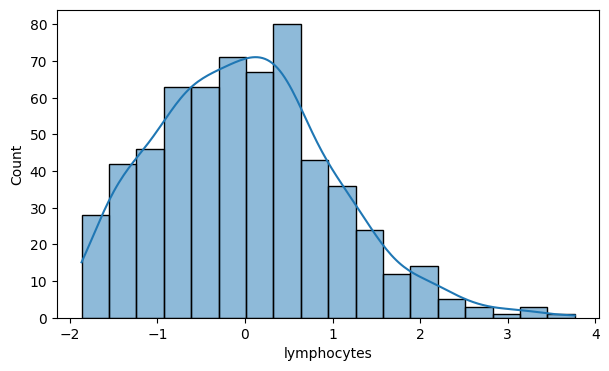

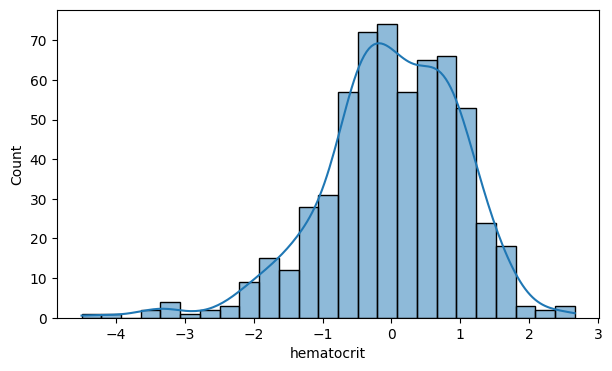

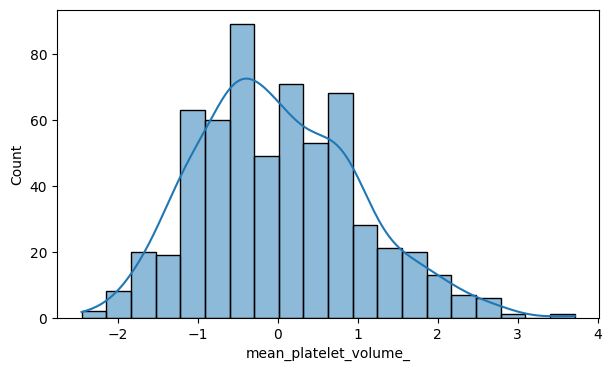

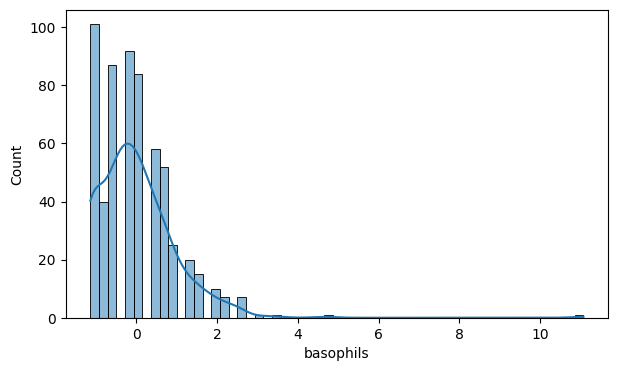

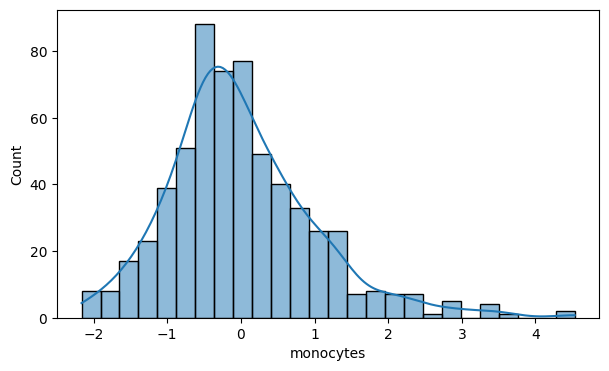

In [38]:
# Plot all the columns to look at their distributions

for i in df2.columns:
    plt.figure(figsize = (7,4))
    sns.histplot(data = df2, x=i, kde = True)
    plt.show()

* More of the continuous features are close to normal distribution. However, some of them are right, and some of them are left skewed.


# Outliers Treatment

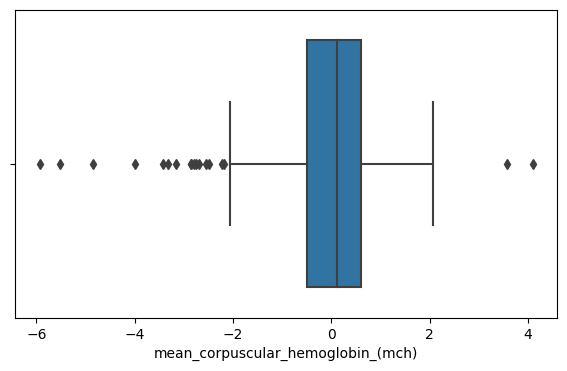

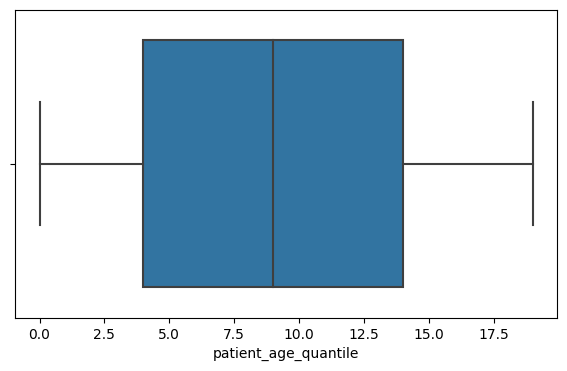

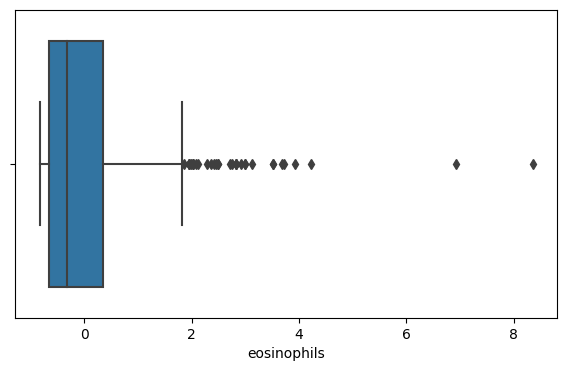

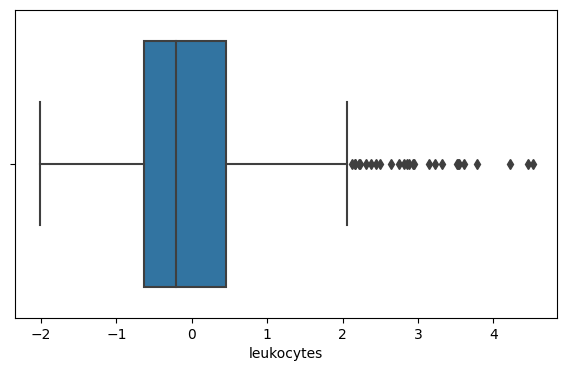

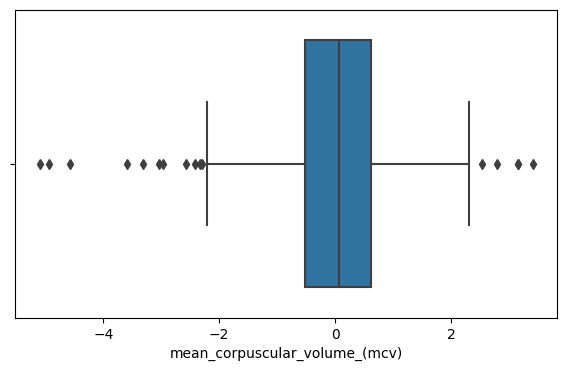

...

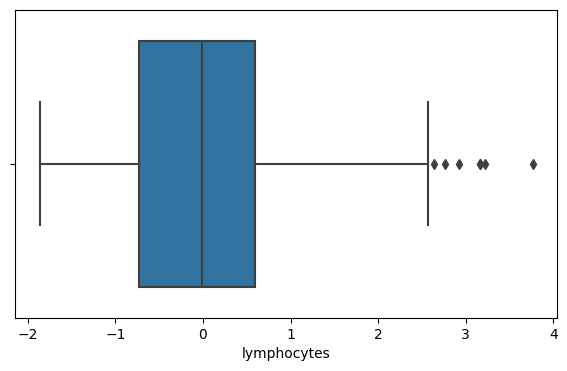

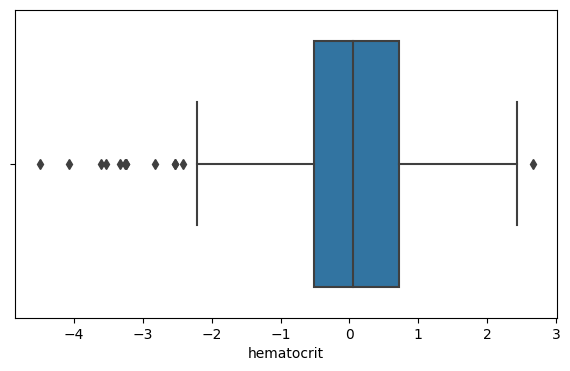

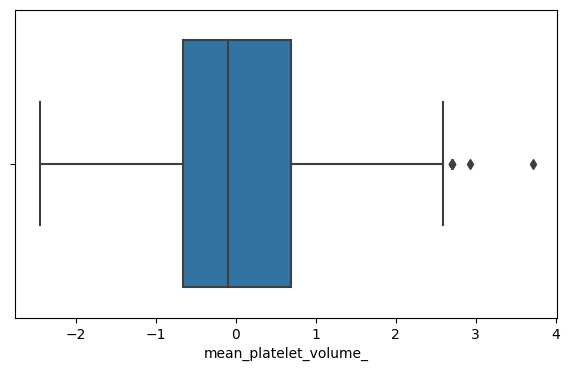

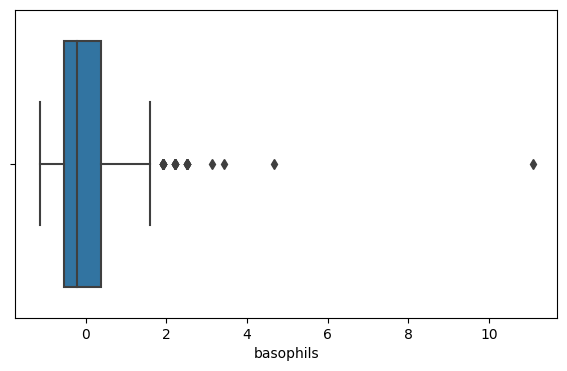

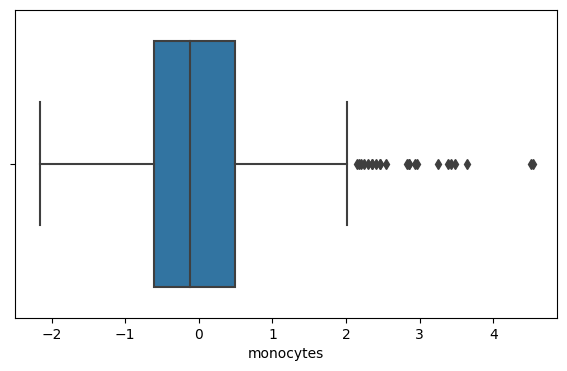

In [39]:
# Plot all the columns to look at the outliers

for i in df2.columns:
    plt.figure (figsize = (7,4))
    sns.boxplot(data=df2, x=i)
    plt.show()

As we see there are a few outliers in each numerical features, except for patient age. I decided the remove the outlier data

In [40]:
# remove the data out of 95% confidence level 
def filter_data(df):
    for col in df.columns:
        print("filtering the ",col)
        if (((df[col].dtype)=='float64') | ((df[col].dtype)=='int64')):
            percentiles = df[col].quantile([0.025,0.975]).values
            df[col][df[col] <= percentiles[0]] = percentiles[0]
            df[col][df[col] >= percentiles[1]] = percentiles[1]
        else:
            df[col]=df[col]
    return df

In [41]:
df2=filter_data(df2)

filtering the  mean_corpuscular_hemoglobin_(mch)
filtering the  patient_age_quantile
filtering the  eosinophils
filtering the  leukocytes
filtering the  mean_corpuscular_volume_(mcv)
filtering the  hemoglobin
filtering the  platelets
filtering the  red_blood_cells
filtering the  mean_corpuscular_hemoglobin_concentration (mchc)
filtering the  red_blood_cell_distribution_width_(rdw)
filtering the  lymphocytes
filtering the  hematocrit
filtering the  mean_platelet_volume_
filtering the  basophils
filtering the  monocytes


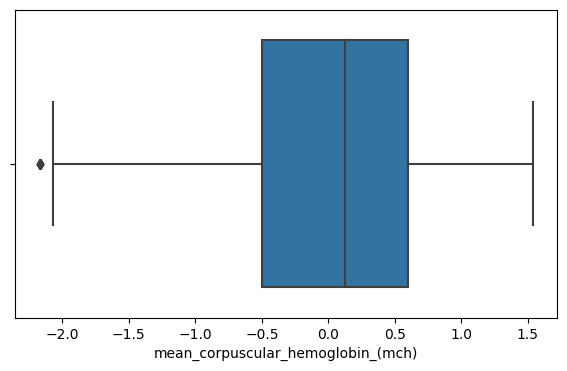

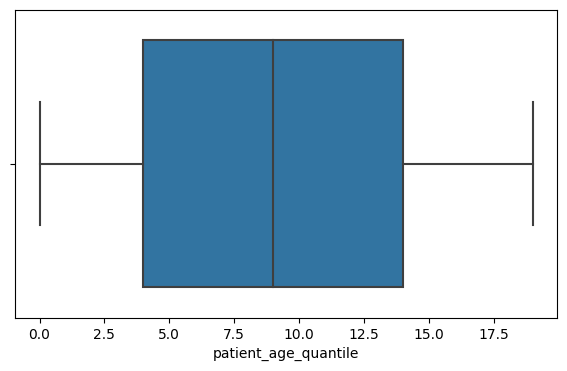

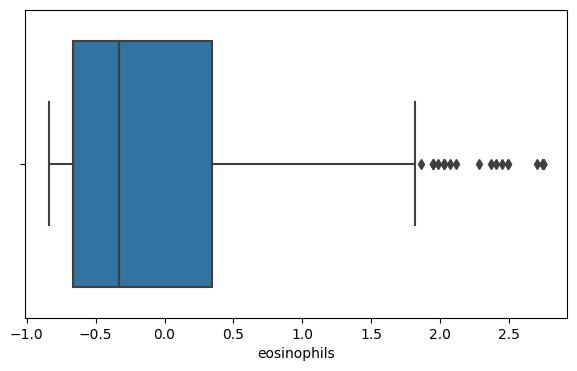

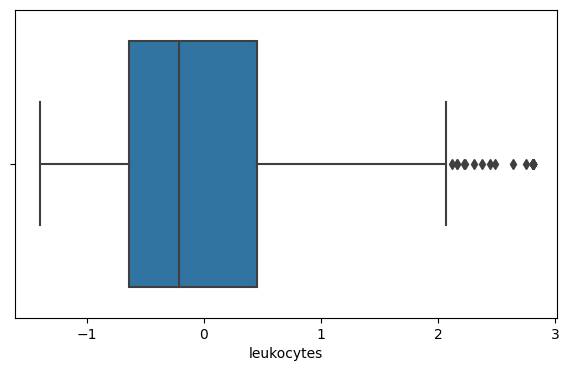

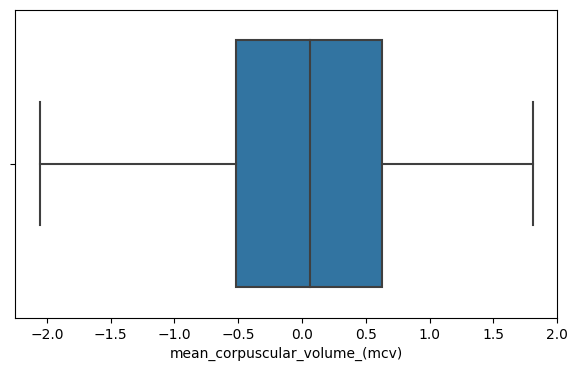

...

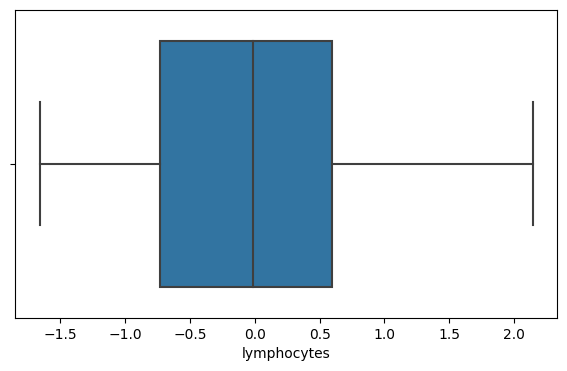

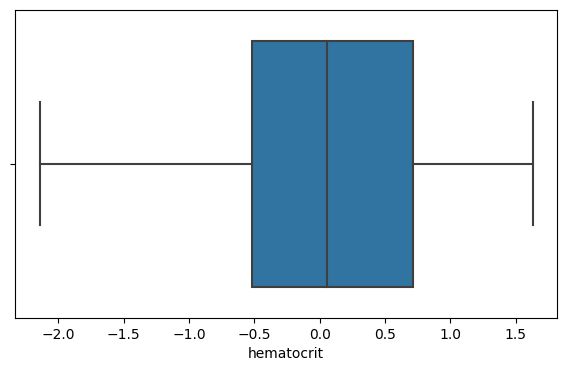

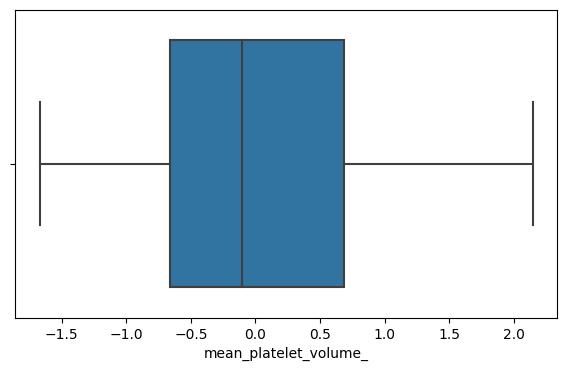

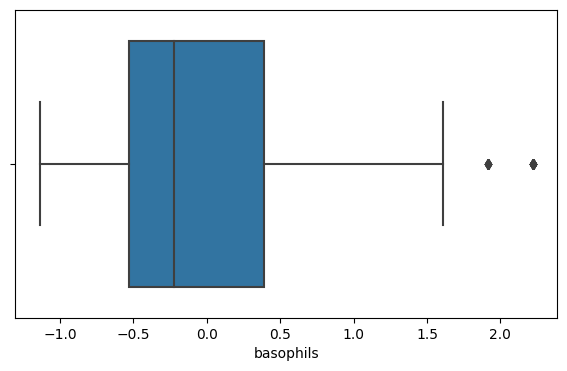

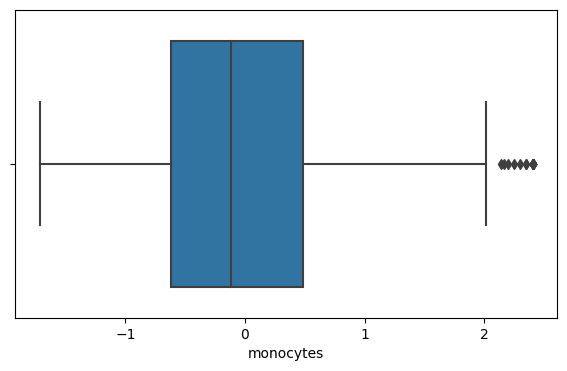

In [42]:
# Plot all the columns to look at the outliers
for i in df2.columns:
    plt.figure(figsize = (7, 4))
    sns.boxplot(data = df2, x = i)
    plt.show()

Almost no outlier left.

In [43]:
df2['sars-cov-2_exam_result'] = df['sars-cov-2_exam_result']

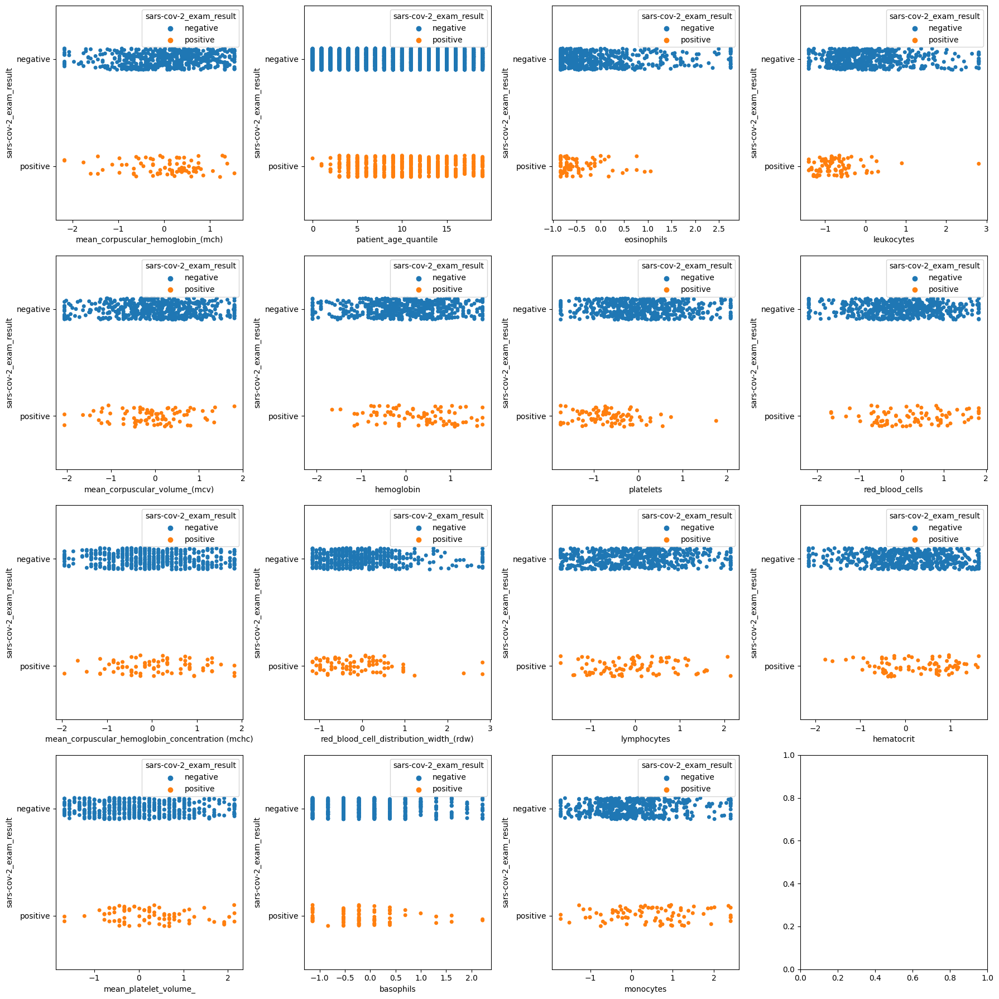

In [44]:
# To observe the relationship between numerical values and the Sars-cov2 result, first create a stripplot.
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(18, 18))
row = 0
column = 0
for f in df2.columns:
    if not f == 'sars-cov-2_exam_result':
        sns.stripplot(x=f, y='sars-cov-2_exam_result', data=df2, ax=axes[row][column], hue='sars-cov-2_exam_result')
        column += 1
        if column > 3:
            column = 0
            row += 1
plt.tight_layout()
plt.show()


* It is hard to see relationship between features and covid positive cases. However, there are some cases associated with positive cases.  
* Negative leukocytes can be associated with more positive covid cases.

### **Correlation between numeric Variables**

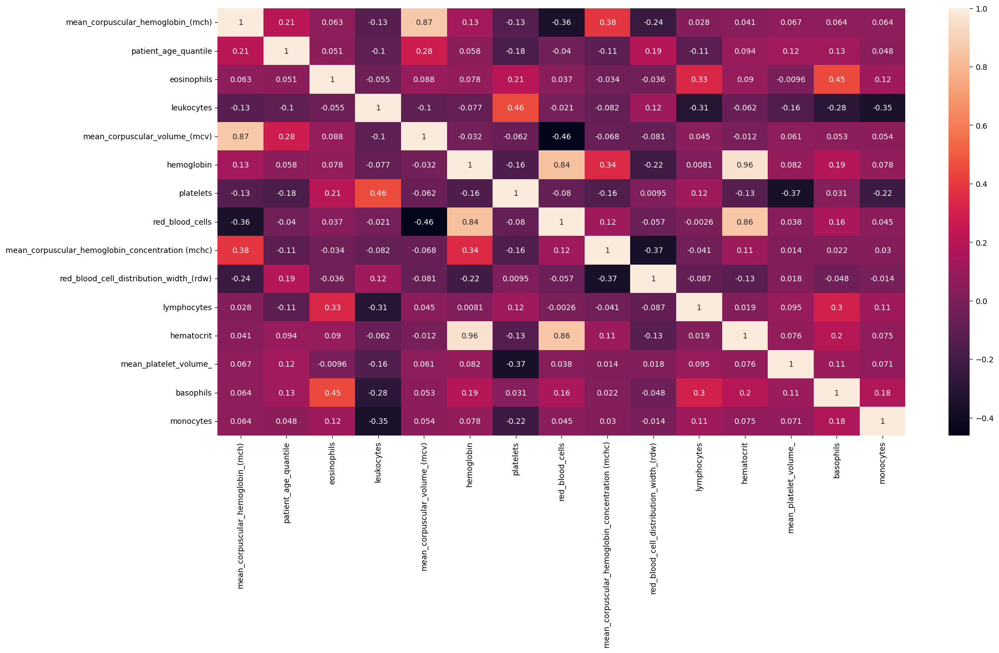

In [89]:

plt.figure(figsize=(20,10))
myBasicCorr = df2.corr('spearman')
sns.heatmap(myBasicCorr, annot = True)
plt.show()




Abs values higher than 0.85 must be taken into account for collinearity. 

#### ** hemoglobin and hematocrit and red_blood_cells
#### ** mean_corpuscular_volume_(mcv) and mean_corpuscular_hemoglobin_(mch)

### **Bivariate Distributions for continuous attributes**

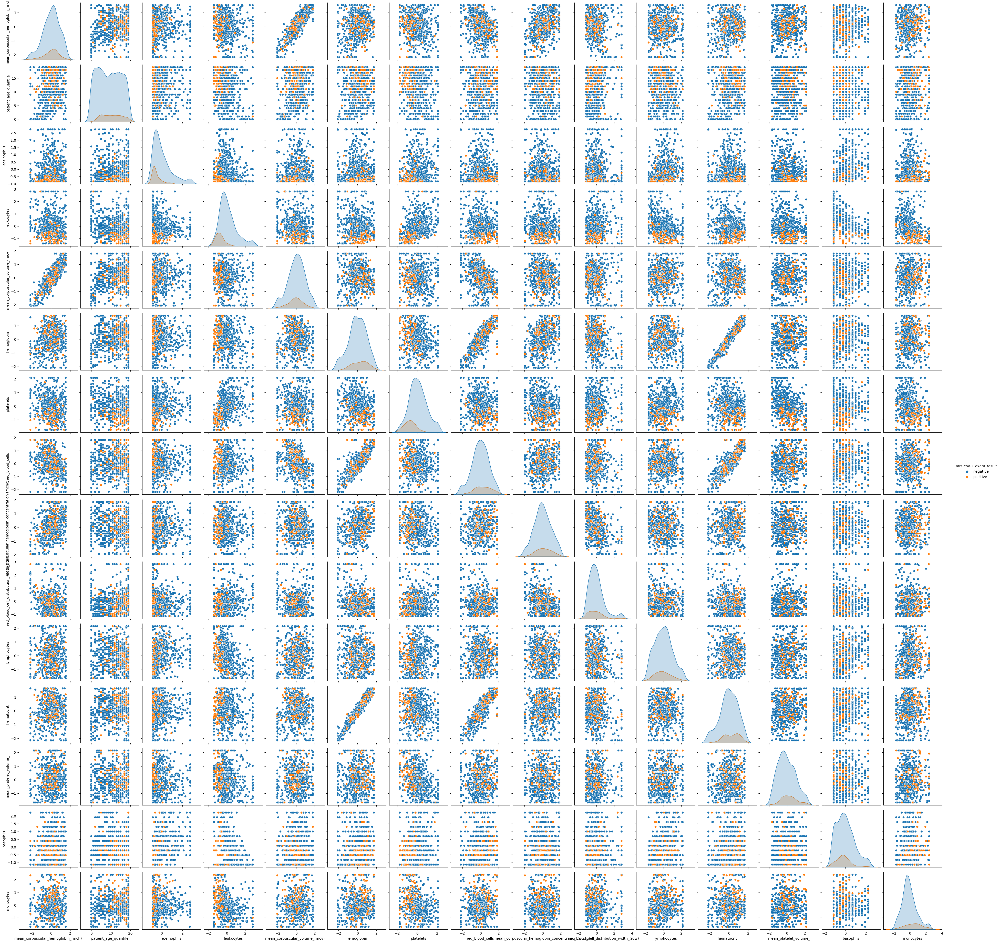

In [46]:
sns.pairplot(df2, hue='sars-cov-2_exam_result')
plt.show()


<Axes: xlabel='lymphocytes', ylabel='hematocrit'>

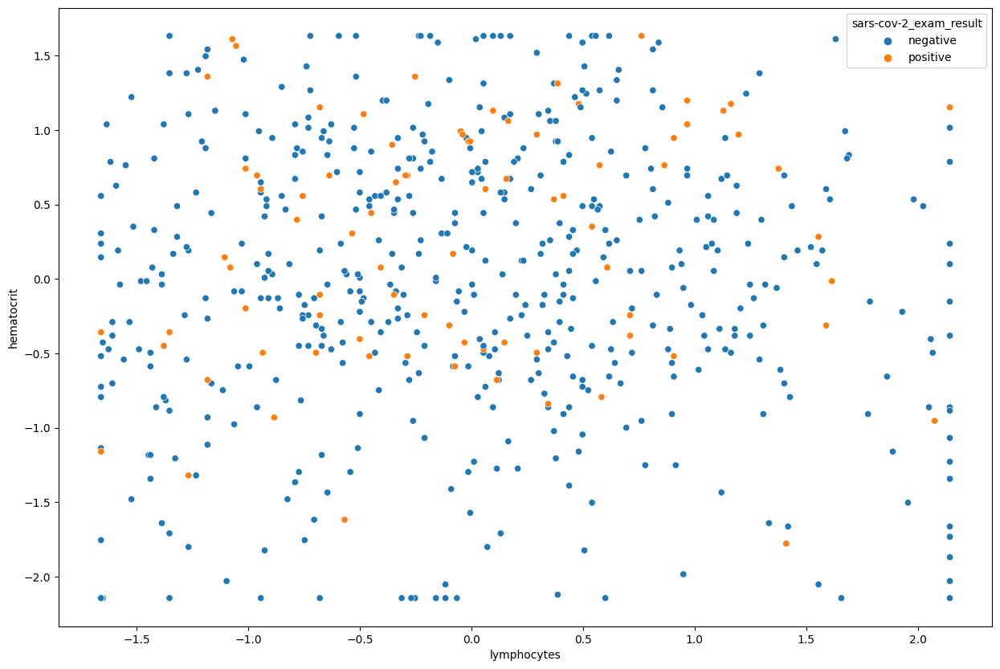

In [47]:
plt.figure(figsize=(15,10))
sns.scatterplot(data=df2, x="lymphocytes",y="hematocrit",hue="sars-cov-2_exam_result")

<Axes: xlabel='hemoglobin', ylabel='hematocrit'>

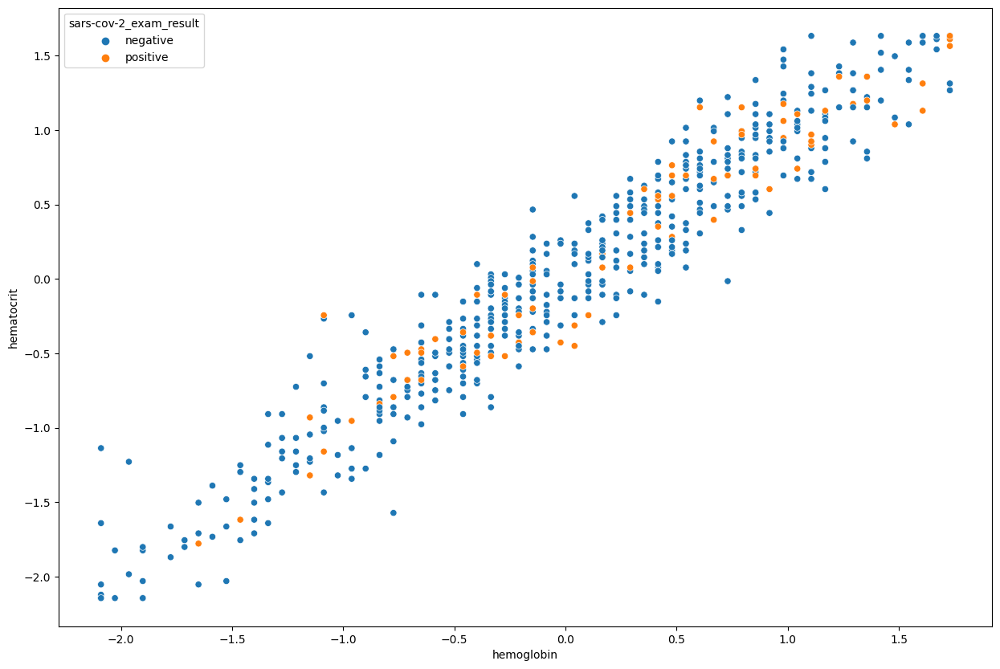

In [48]:
plt.figure(figsize=(15,10))
sns.scatterplot(data=df2, x="hemoglobin",y="hematocrit",hue="sars-cov-2_exam_result")

Hematocrit and haemoglobin are two features where positive covid instances exist in their positive values. These features may signal positive COVID scenarios when we have greater values for them.
High correlation can be observed from this plot.

<Axes: xlabel='leukocytes', ylabel='basophils'>

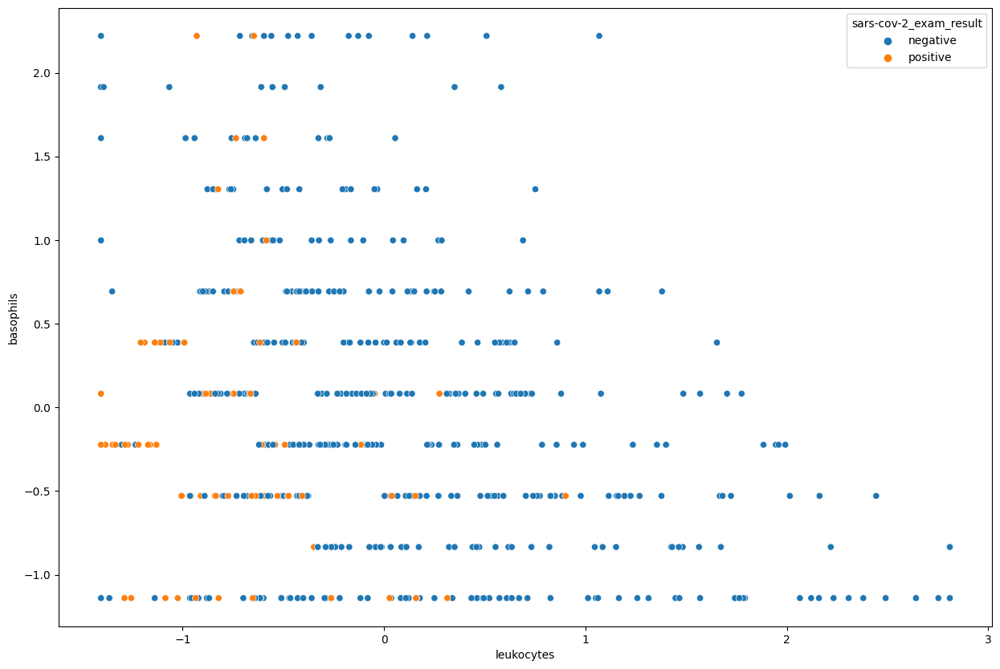

In [49]:
plt.figure(figsize=(15,10))
sns.scatterplot(data=df2, x="leukocytes",y="basophils",hue="sars-cov-2_exam_result")

Basophils and leukocytes are not well correlated, but positive covid cases exist more in the negative leukocytes values. 


### **Imputation and Feature Engineering**

In [52]:
df2_new = df2.drop('sars-cov-2_exam_result', axis=1, inplace=True)

In [53]:
# assign original dataframe into a new dataframes.
df1_new = df1
df2_new = df2

In [54]:
# Checking missing values again for categorical data
df1_new.isnull().sum()

sars-cov-2_exam_result                                      0
patient_addmited_to_regular_ward_(1=yes,_0=no)              0
patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)       0
patient_addmited_to_intensive_care_unit_(1=yes,_0=no)       0
respiratory_syncytial_virus                              4290
influenza_a                                              4290
influenza_b                                              4290
parainfluenza_1                                          4292
coronavirusnl63                                          4292
rhinovirus/enterovirus                                   4292
coronavirus_hku1                                         4292
parainfluenza_3                                          4292
chlamydophila_pneumoniae                                 4292
adenovirus                                               4292
parainfluenza_4                                          4292
coronavirus229e                                          4292
coronavi

In [55]:
df1_new.shape

(5644, 22)

In [56]:
# We first need to look at the categorical attributes.
categ1 = []
# Loop to evaluate if it's categorical
for j in df1_new.columns:
    categ1.append(j)
    
print(categ1)
len(categ1)

['sars-cov-2_exam_result', 'patient_addmited_to_regular_ward_(1=yes,_0=no)', 'patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)', 'patient_addmited_to_intensive_care_unit_(1=yes,_0=no)', 'respiratory_syncytial_virus', 'influenza_a', 'influenza_b', 'parainfluenza_1', 'coronavirusnl63', 'rhinovirus/enterovirus', 'coronavirus_hku1', 'parainfluenza_3', 'chlamydophila_pneumoniae', 'adenovirus', 'parainfluenza_4', 'coronavirus229e', 'coronavirusoc43', 'inf_a_h1n1_2009', 'bordetella_pertussis', 'metapneumovirus', 'influenza_b,_rapid_test', 'influenza_a,_rapid_test']


22

In [57]:
# columns with missing values
categ_missing1 = categ1[4:22]
print(categ_missing1)

['respiratory_syncytial_virus', 'influenza_a', 'influenza_b', 'parainfluenza_1', 'coronavirusnl63', 'rhinovirus/enterovirus', 'coronavirus_hku1', 'parainfluenza_3', 'chlamydophila_pneumoniae', 'adenovirus', 'parainfluenza_4', 'coronavirus229e', 'coronavirusoc43', 'inf_a_h1n1_2009', 'bordetella_pertussis', 'metapneumovirus', 'influenza_b,_rapid_test', 'influenza_a,_rapid_test']


In [58]:
# Changing string values to numerical values
for j in categ1:
    if 'positive' in list(df1_new[j].unique()):
        df1[j].replace('positive',1, inplace=True)
    elif 'detected' in list(df1_new[j].unique()):
        df1[j].replace('detected',1, inplace=True)
    if 'negative' in list(df1_new[j].unique()):
        df1[j].replace('negative',0, inplace=True) 
    elif 'not_detected' in list(df1_new[j].unique()):
        df1[j].replace('not_detected',0, inplace=True)

In [59]:
# Eval categories for all discrete features
for i in categ1:
    print(i, ' - ', df1_new[i].unique())

sars-cov-2_exam_result  -  [0 1]
patient_addmited_to_regular_ward_(1=yes,_0=no)  -  [0 1]
patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)  -  [0 1]
patient_addmited_to_intensive_care_unit_(1=yes,_0=no)  -  [0 1]
respiratory_syncytial_virus  -  [nan  0.  1.]
influenza_a  -  [nan  0.  1.]
influenza_b  -  [nan  0.  1.]
parainfluenza_1  -  [nan  0.  1.]
coronavirusnl63  -  [nan  0.  1.]
rhinovirus/enterovirus  -  [nan  1.  0.]
coronavirus_hku1  -  [nan  0.  1.]
parainfluenza_3  -  [nan  0.  1.]
chlamydophila_pneumoniae  -  [nan  0.  1.]
adenovirus  -  [nan  0.  1.]
parainfluenza_4  -  [nan  0.  1.]
coronavirus229e  -  [nan  0.  1.]
coronavirusoc43  -  [nan  0.  1.]
inf_a_h1n1_2009  -  [nan  0.  1.]
bordetella_pertussis  -  [nan  0.  1.]
metapneumovirus  -  [nan  0.  1.]
influenza_b,_rapid_test  -  [nan  0.  1.]
influenza_a,_rapid_test  -  [nan  0.  1.]


In [60]:
# Checking missing values again for categorical data
df2_new.isnull().sum()

mean_corpuscular_hemoglobin_(mch)                   5042
patient_age_quantile                                   0
eosinophils                                         5042
leukocytes                                          5042
mean_corpuscular_volume_(mcv)                       5042
hemoglobin                                          5041
platelets                                           5042
red_blood_cells                                     5042
mean_corpuscular_hemoglobin_concentration (mchc)    5042
red_blood_cell_distribution_width_(rdw)             5042
lymphocytes                                         5042
hematocrit                                          5041
mean_platelet_volume_                               5045
basophils                                           5042
monocytes                                           5043
dtype: int64

In [61]:
# We first need to look at the categorical attributes.
categ2 = []
# Loop to evaluate if it's categorical

for a in df2_new.columns:
    categ2.append(a)
print(categ2)
len(categ2)

['mean_corpuscular_hemoglobin_(mch)', 'patient_age_quantile', 'eosinophils', 'leukocytes', 'mean_corpuscular_volume_(mcv)', 'hemoglobin', 'platelets', 'red_blood_cells', 'mean_corpuscular_hemoglobin_concentration\xa0(mchc)', 'red_blood_cell_distribution_width_(rdw)', 'lymphocytes', 'hematocrit', 'mean_platelet_volume_', 'basophils', 'monocytes']


15

In [62]:
# pylint: disable=missing-final-newline
categ_missing2 = categ2[0:4] +categ2[5::]
print(categ_missing2)

['mean_corpuscular_hemoglobin_(mch)', 'patient_age_quantile', 'eosinophils', 'leukocytes', 'hemoglobin', 'platelets', 'red_blood_cells', 'mean_corpuscular_hemoglobin_concentration\xa0(mchc)', 'red_blood_cell_distribution_width_(rdw)', 'lymphocytes', 'hematocrit', 'mean_platelet_volume_', 'basophils', 'monocytes']


In [63]:
# Eval categories for all numerical features

for o in categ2:
    print(o,' - ', df2_new[o].unique())

mean_corpuscular_hemoglobin_(mch)  -  [        nan -0.29226932  0.17817499  1.53723609  0.33498943 -0.08318307
  0.54407668  0.59634751 -0.71044278  0.43953303 -0.18772669  0.2827186
 -0.13545488  0.23044679 -0.39681295  0.96224916  1.06679273  1.32815075
 -0.50135559  0.12590317 -0.34454113 -0.91952902 -0.81498539  0.75316292
  0.64861929 -0.65817094  0.49180484 -0.23999751  1.48496521 -1.12861538
  0.90997738 -0.03091126  1.43269444 -1.65133142  1.38042164 -0.55362737
  0.80543476  0.70089114 -1.02407169 -0.44908476 -1.96496129  0.38726124
 -0.60589916  1.27587795 -1.28542972  1.1190635  -1.33770156  0.02136055
 -1.44224524  1.17133534 -1.70360327  0.07363137  1.22360718 -0.97180086
 -0.76271361 -1.49451697 -0.86725724 -1.1808871  -1.07634354  1.014521
 -1.3899734   0.85770553 -2.17143388 -1.75587511 -1.54678786 -1.23315895
 -1.80814588 -1.59905958 -2.06950402 -1.86041772]
patient_age_quantile  -  [13 17  8  5 15  9 16  1 14 11  0  3 10  6 12 19  7 18  2  4]
eosinophils  -  [        

In [64]:
# Combine the two datasets

df_all = pd.concat([df1_new,df2_new], axis=1)

In [65]:
df_all.shape

(5644, 37)

In [66]:
df_all.head()

,sars-cov-2_exam_result,"patient_addmited_to_regular_ward_(1=yes,_0=no)","patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)","patient_addmited_to_intensive_care_unit_(1=yes,_0=no)",respiratory_syncytial_virus,influenza_a,influenza_b,parainfluenza_1,coronavirusnl63,rhinovirus/enterovirus,...,hemoglobin,platelets,red_blood_cells,mean_corpuscular_hemoglobin_concentration (mchc),red_blood_cell_distribution_width_(rdw),lymphocytes,hematocrit,mean_platelet_volume_,basophils,monocytes
0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,...,-0.02234,-0.517413,0.102004,-0.95079,-0.625073,0.318366,0.236515,0.010677,-0.223767,0.357547
2,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [67]:
# combine the missing values columns
categ_missing = categ_missing1 + categ_missing2
print(categ_missing)

['respiratory_syncytial_virus', 'influenza_a', 'influenza_b', 'parainfluenza_1', 'coronavirusnl63', 'rhinovirus/enterovirus', 'coronavirus_hku1', 'parainfluenza_3', 'chlamydophila_pneumoniae', 'adenovirus', 'parainfluenza_4', 'coronavirus229e', 'coronavirusoc43', 'inf_a_h1n1_2009', 'bordetella_pertussis', 'metapneumovirus', 'influenza_b,_rapid_test', 'influenza_a,_rapid_test', 'mean_corpuscular_hemoglobin_(mch)', 'patient_age_quantile', 'eosinophils', 'leukocytes', 'hemoglobin', 'platelets', 'red_blood_cells', 'mean_corpuscular_hemoglobin_concentration\xa0(mchc)', 'red_blood_cell_distribution_width_(rdw)', 'lymphocytes', 'hematocrit', 'mean_platelet_volume_', 'basophils', 'monocytes']


In [68]:
len(categ_missing)

32

### 32 columns have missing values.

In [69]:
categ=[]

for q in df_all.columns:
    categ.append(q)
    
print(categ)
len(categ)

['sars-cov-2_exam_result', 'patient_addmited_to_regular_ward_(1=yes,_0=no)', 'patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)', 'patient_addmited_to_intensive_care_unit_(1=yes,_0=no)', 'respiratory_syncytial_virus', 'influenza_a', 'influenza_b', 'parainfluenza_1', 'coronavirusnl63', 'rhinovirus/enterovirus', 'coronavirus_hku1', 'parainfluenza_3', 'chlamydophila_pneumoniae', 'adenovirus', 'parainfluenza_4', 'coronavirus229e', 'coronavirusoc43', 'inf_a_h1n1_2009', 'bordetella_pertussis', 'metapneumovirus', 'influenza_b,_rapid_test', 'influenza_a,_rapid_test', 'mean_corpuscular_hemoglobin_(mch)', 'patient_age_quantile', 'eosinophils', 'leukocytes', 'mean_corpuscular_volume_(mcv)', 'hemoglobin', 'platelets', 'red_blood_cells', 'mean_corpuscular_hemoglobin_concentration\xa0(mchc)', 'red_blood_cell_distribution_width_(rdw)', 'lymphocytes', 'hematocrit', 'mean_platelet_volume_', 'basophils', 'monocytes']


37

### we have 37 columns in total, and 5 of them has no missing values.

Performing model  on the rows with fewer than 40% missing values

In [70]:
sixty_missing_level = int((len(df_all.columns))/1.6)
df_all['count'] = df_all.apply(lambda x: x.count(), axis=1)
df_all=df_all[df_all['count']>sixty_missing_level ]
df_all=df_all.drop(['count'], axis=1)
df_all = df_all.reset_index(drop=True)

In [71]:
sixty_missing_level


23

If there are missing values in 23 or more columns, those rows have been eliminated.

In [72]:
df_all.shape

(366, 37)

In [73]:
df_all.tail()

,sars-cov-2_exam_result,"patient_addmited_to_regular_ward_(1=yes,_0=no)","patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)","patient_addmited_to_intensive_care_unit_(1=yes,_0=no)",respiratory_syncytial_virus,influenza_a,influenza_b,parainfluenza_1,coronavirusnl63,rhinovirus/enterovirus,...,hemoglobin,platelets,red_blood_cells,mean_corpuscular_hemoglobin_concentration (mchc),red_blood_cell_distribution_width_(rdw),lymphocytes,hematocrit,mean_platelet_volume_,basophils,monocytes
361,1,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.356092,-1.747842,0.384090,0.841616,-0.094334,0.966573,1.197836,1.132609,-0.529226,1.197969
362,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.165628,-0.102873,0.384090,-0.054585,0.347948,-1.583611,0.190738,0.908221,-0.834685,1.066653
363,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.523588,0.663397,0.754327,-1.050367,0.967144,-1.532437,-0.289922,-0.774677,0.081693,1.670707
364,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.105468,-0.492289,0.613284,1.538664,-1.155812,0.002791,0.717175,-0.213711,-0.223767,0.909074
365,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,...,-2.089987,-1.747842,-2.189501,1.538664,-0.448160,-1.660159,-2.143897,-0.550290,-1.140144,1.381812


In [74]:
# Checking missing values again for categorical data

df_all.isnull().sum()

sars-cov-2_exam_result                                     0
patient_addmited_to_regular_ward_(1=yes,_0=no)             0
patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)      0
patient_addmited_to_intensive_care_unit_(1=yes,_0=no)      0
respiratory_syncytial_virus                                0
influenza_a                                                0
influenza_b                                                0
parainfluenza_1                                            0
coronavirusnl63                                            0
rhinovirus/enterovirus                                     0
coronavirus_hku1                                           0
parainfluenza_3                                            0
chlamydophila_pneumoniae                                   0
adenovirus                                                 0
parainfluenza_4                                            0
coronavirus229e                                            0
coronavirusoc43         

**KNN imputation** method will be used for this. This sklearn method requires us to encode categorical variables if we are using them for imputation. 

In [75]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors = 2, weights = "uniform")  # 2 Nearest Neighbours
temp_df_for_imputation = categ_missing

temp_df_for_imputation = imputer.fit_transform(df_all[temp_df_for_imputation])
temp_df_for_imputation = pd.DataFrame(
    temp_df_for_imputation,
    columns=categ_missing,
)


In [76]:
temp_df_for_imputation.columns

Index(['respiratory_syncytial_virus', 'influenza_a', 'influenza_b',
       'parainfluenza_1', 'coronavirusnl63', 'rhinovirus/enterovirus',
       'coronavirus_hku1', 'parainfluenza_3', 'chlamydophila_pneumoniae',
       'adenovirus', 'parainfluenza_4', 'coronavirus229e', 'coronavirusoc43',
       'inf_a_h1n1_2009', 'bordetella_pertussis', 'metapneumovirus',
       'influenza_b,_rapid_test', 'influenza_a,_rapid_test',
       'mean_corpuscular_hemoglobin_(mch)', 'patient_age_quantile',
       'eosinophils', 'leukocytes', 'hemoglobin', 'platelets',
       'red_blood_cells', 'mean_corpuscular_hemoglobin_concentration (mchc)',
       'red_blood_cell_distribution_width_(rdw)', 'lymphocytes', 'hematocrit',
       'mean_platelet_volume_', 'basophils', 'monocytes'],
      dtype='object')

In [77]:
# Add imputed columns to the original dataset
for i in temp_df_for_imputation.columns:
    df_all[i] = temp_df_for_imputation[i]

Refer: https://scikit-learn.org/stable/modules/generated/sklearn.impute.KNNImputer.html

In [78]:
df_all.isnull().sum()

sars-cov-2_exam_result                                   0
patient_addmited_to_regular_ward_(1=yes,_0=no)           0
patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)    0
patient_addmited_to_intensive_care_unit_(1=yes,_0=no)    0
respiratory_syncytial_virus                              0
influenza_a                                              0
influenza_b                                              0
parainfluenza_1                                          0
coronavirusnl63                                          0
rhinovirus/enterovirus                                   0
coronavirus_hku1                                         0
parainfluenza_3                                          0
chlamydophila_pneumoniae                                 0
adenovirus                                               0
parainfluenza_4                                          0
coronavirus229e                                          0
coronavirusoc43                                         

No missing values left!

### **Removing Multicollinearity and Feature Engineering**
 **To remove multicollinearity**
  1. Drop every column that has VIF score greater than 5, one by one
  2. Look at the adjusted R square of all these models
  3. Drop the Variable that makes the least change in Adjusted-R square
  4. Check the VIF Scores again
  5. Continue till you get all VIF scores under 5

In Python, we can calculate the VIF using a function called variance_inflation_factor from the statsmodels library. Here is the code and its result for doing that:

In [79]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df_all[list(df_all.columns[1:])]
vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


,VIF,Column
32,247.089061,hematocrit
26,208.682354,hemoglobin
21,117.663788,mean_corpuscular_hemoglobin_(mch)
25,112.671063,mean_corpuscular_volume_(mcv)
28,42.266465,red_blood_cells
29,31.172245,mean_corpuscular_hemoglobin_concentration (mchc)
24,2.393818,leukocytes
22,2.273750,patient_age_quantile
27,2.035565,platelets
31,1.877344,lymphocytes


From those features, we can generate the new one. The new feature will contain the difference value between those pairs. After we create those features, we can safely remove them from our data.

In [80]:
X.columns

Index(['patient_addmited_to_regular_ward_(1=yes,_0=no)',
       'patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)',
       'patient_addmited_to_intensive_care_unit_(1=yes,_0=no)',
       'respiratory_syncytial_virus', 'influenza_a', 'influenza_b',
       'parainfluenza_1', 'coronavirusnl63', 'rhinovirus/enterovirus',
       'coronavirus_hku1', 'parainfluenza_3', 'chlamydophila_pneumoniae',
       'adenovirus', 'parainfluenza_4', 'coronavirus229e', 'coronavirusoc43',
       'inf_a_h1n1_2009', 'bordetella_pertussis', 'metapneumovirus',
       'influenza_b,_rapid_test', 'influenza_a,_rapid_test',
       'mean_corpuscular_hemoglobin_(mch)', 'patient_age_quantile',
       'eosinophils', 'leukocytes', 'mean_corpuscular_volume_(mcv)',
       'hemoglobin', 'platelets', 'red_blood_cells',
       'mean_corpuscular_hemoglobin_concentration (mchc)',
       'red_blood_cell_distribution_width_(rdw)', 'lymphocytes', 'hematocrit',
       'mean_platelet_volume_', 'basophils', 'monocytes'],
      d

In [81]:
X['hemoglobin']

0     -0.022340
1     -0.774212
2     -0.586244
3      0.792188
4      0.854844
         ...   
361    1.356092
362    0.165628
363   -0.523588
364    1.105468
365   -2.089987
Name: hemoglobin, Length: 366, dtype: float64

In [82]:
X["hem_add"]= X['hemoglobin']+X['hematocrit']
X['corpuslar_add']= X['mean_corpuscular_volume_(mcv)']+X['mean_corpuscular_hemoglobin_(mch)']
X = X.drop(['hemoglobin','hematocrit','mean_corpuscular_volume_(mcv)','mean_corpuscular_hemoglobin_(mch)'], axis=1)
#X=df_all.drop(['hemoglobin','mean_corpuscular_hemoglobin_(mch)','full_count'], axis=1)
X.head()

,"patient_addmited_to_regular_ward_(1=yes,_0=no)","patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)","patient_addmited_to_intensive_care_unit_(1=yes,_0=no)",respiratory_syncytial_virus,influenza_a,influenza_b,parainfluenza_1,coronavirusnl63,rhinovirus/enterovirus,coronavirus_hku1,...,platelets,red_blood_cells,mean_corpuscular_hemoglobin_concentration (mchc),red_blood_cell_distribution_width_(rdw),lymphocytes,mean_platelet_volume_,basophils,monocytes,hem_add,corpuslar_add
0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,-0.517413,0.102004,-0.950790,-0.625073,0.318366,0.010677,-0.223767,0.357547,0.214175,-0.126077
1,0,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.429667,-0.850035,1.837398,-0.978899,-0.005738,-1.672222,-0.223767,0.068652,-2.345894,-1.157849
2,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.429480,-1.361315,0.542882,-1.067355,-1.114514,-0.213711,0.081693,1.276759,-1.333937,3.205645
3,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.072992,0.542763,-0.452899,0.171035,0.045436,-0.550290,-0.834685,-0.220244,1.784026,0.941831
4,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,-0.178244,0.489872,-0.353319,0.171035,-0.730707,0.796029,2.219906,0.068652,1.869570,1.311156


In [83]:
vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


,VIF,Column
25,35.885659,red_blood_cells
32,31.147388,hem_add
33,9.174066,corpuslar_add
23,2.383854,leukocytes
21,2.244801,patient_age_quantile
24,1.999427,platelets
28,1.867259,lymphocytes
19,1.629247,"influenza_b,_rapid_test"
27,1.532519,red_blood_cell_distribution_width_(rdw)
30,1.508481,basophils


As can be seen from the example above, still have variables with very high VIF values

In [84]:
X = X.drop(["hem_add"], axis=1)


In [85]:
vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


,VIF,Column
23,2.382519,leukocytes
21,2.244047,patient_age_quantile
24,1.987758,platelets
28,1.867257,lymphocytes
32,1.788112,corpuslar_add
19,1.628990,"influenza_b,_rapid_test"
25,1.538813,red_blood_cells
30,1.506514,basophils
3,1.478275,respiratory_syncytial_virus
27,1.472110,red_blood_cell_distribution_width_(rdw)


As can be seen from the example above, there are not high VIF values anymore. 

In [86]:
# Assign the new data as dataset into different dataframe
dataset = X

Currently, every variable has a VIF value of less than 5. Now that we have those variables, we can interpret the outcome. Let's first create our machine learning model, though.

Refer: https://towardsdatascience.com/how-to-remove-multicollinearity-using-python-4da8d9d8abb2

### **Proposed approach**

--------------------
### **Potential techniques** :
--------------------
Since it is a binary prediction problem,  we will use classification models logistic regression, SVM, Decision Tree and Random Forest. 
One of the most used analytical methods, binary prediction has several uses across a variety of industries. Because logistic regression is
highly descriptive with good accuracy and has reasonable computational requirements , I will start with it.

### **Building the model**

We will be building 4 different models:

- **Logistic Regression**
- **Support Vector Machine(SVM)**
- **Decision Tree**
- **Random Forest**

-------------------
### **Overall design** : 
---------------------

* create a column for the class
* Standardize the data
* Splitting the data and proceeding with modeling.
* Find best Hyperparameter for SVM, Classification Trees and Logistic Regression
* Find the method performs best using test data

-----------------
### **Measures of success** :
-----------------
Accuracy of Confusion Matrix (important), Precision, Recall (important) and F-1 Score

### **Model evaluation criterion**

**The model can make two types of wrong predictions:**
1. Predicting a patient is positive and the patient is not positive.
2. Predicting a patient is negative and the patient is not negative..

**Which case is more important?**
* Predicting that patient is negative, but indeed, patient is positive. Therefore, we would want to maximize `Recall`. Therefore, the focus should be on improving Recall or reducing false negatives.

In [107]:
# To tune model, get different metric scores, and split data

from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import  recall_score
from sklearn.metrics import precision_score
#from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
#from sklearn.metrics import  plot_confusion_matrix
from sklearn.metrics import  classification_report
from sklearn.metrics import precision_recall_curve


from sklearn import metrics

from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To impute missing values
from sklearn.impute import SimpleImputer

# To help with model building
from sklearn.linear_model import LogisticRegression

# To build classification models 
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import tree

# For tuning the model
from sklearn.model_selection import GridSearchCV

# To supress warnings
import warnings
warnings.filterwarnings("ignore")

In [88]:
dataset.head(10)

,"patient_addmited_to_regular_ward_(1=yes,_0=no)","patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)","patient_addmited_to_intensive_care_unit_(1=yes,_0=no)",respiratory_syncytial_virus,influenza_a,influenza_b,parainfluenza_1,coronavirusnl63,rhinovirus/enterovirus,coronavirus_hku1,...,leukocytes,platelets,red_blood_cells,mean_corpuscular_hemoglobin_concentration (mchc),red_blood_cell_distribution_width_(rdw),lymphocytes,mean_platelet_volume_,basophils,monocytes,corpuslar_add
0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,-0.094610,-0.517413,0.102004,-0.950790,-0.625073,0.318366,0.010677,-0.223767,0.357547,-0.126077
1,0,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.364550,1.429667,-0.850035,1.837398,-0.978899,-0.005738,-1.672222,-0.223767,0.068652,-1.157849
2,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.884923,-0.429480,-1.361315,0.542882,-1.067355,-1.114514,-0.213711,0.081693,1.276759,3.205645
3,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,-0.211488,0.072992,0.542763,-0.452899,0.171035,0.045436,-0.550290,-0.834685,-0.220244,0.941831
4,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,-0.075131,-0.178244,0.489872,-0.353319,0.171035,-0.730707,0.796029,2.219906,0.068652,1.311156
5,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.105751,0.361914,0.436981,0.642463,-0.713529,-0.227493,-0.550290,-0.529226,0.121178,0.982865
6,1,0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.286623,0.952319,-0.321124,-0.253742,-0.890442,-0.875701,-0.886869,-0.223767,0.804021,-1.385493
7,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.545423,0.072992,0.066744,-0.652057,-0.094334,1.239503,0.571643,0.998070,-0.482876,0.163128
8,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.000005,-0.278739,0.701437,1.040773,-0.094334,-0.261609,1.581381,0.387152,-0.509139,0.425459
9,0,0,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,-0.083479,-0.203368,0.295938,-0.950790,-0.359703,-0.261609,0.459449,-0.223767,-0.246507,1.711747


**Separating the independent variables (X) and the dependent variable (Y)**

In [90]:
y = df_all["sars-cov-2_exam_result"]
y.value_counts()

sars-cov-2_exam_result
0    314
1     52
Name: count, dtype: int64

### we have total of 366 cases. 52 of them is positive, and 314 of them is negative!

In [91]:
X = dataset
X.shape

(366, 33)

**Splitting the data into 80% train and 20% test set**

To make sure that relative class frequencies are roughly retained in each train and validation fold in such circumstances, it is advised to employ the **stratified sampling** technique.

In [92]:
## Splitting the dataset into the Training set and Test set
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=1,stratify=y)

In [93]:
y_train.value_counts()

sars-cov-2_exam_result
0    251
1     41
Name: count, dtype: int64

In [94]:
y_test.value_counts()

sars-cov-2_exam_result
0    63
1    11
Name: count, dtype: int64

In [95]:
# Checking that no column has missing values in train or test sets
print(X_train.isna().sum())
print("-" * 30)
print(X_test.isna().sum())

patient_addmited_to_regular_ward_(1=yes,_0=no)           0
patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)    0
patient_addmited_to_intensive_care_unit_(1=yes,_0=no)    0
respiratory_syncytial_virus                              0
influenza_a                                              0
influenza_b                                              0
parainfluenza_1                                          0
coronavirusnl63                                          0
rhinovirus/enterovirus                                   0
coronavirus_hku1                                         0
parainfluenza_3                                          0
chlamydophila_pneumoniae                                 0
adenovirus                                               0
parainfluenza_4                                          0
coronavirus229e                                          0
coronavirusoc43                                          0
inf_a_h1n1_2009                                         

**Observation:**
* All missing values have been treated.

### **Encoding categorical variables**

In [96]:
X_train = pd.get_dummies(X_train, drop_first=True)
X_test = pd.get_dummies(X_test, drop_first=True)
print(X_train.shape, X_test.shape)

(292, 33) (74, 33)


**Observation:**
* After encoding there are 33 columns.

##### Creating a function to compute and print the classification report and confusion matrix as well, avoiding the need to write the same code repeatedly for each model.

In [97]:
# Creating metric function 

def metrics_score(actual, predicted):
    print(classification_report(actual, predicted))
    cm = confusion_matrix(actual, predicted)
    plt.figure(figsize=(12,7))
    sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

### **Logistic Regression Model**

-In **binary classification problems**, or cases where a categorical dependent variable has only two potential values, **logistic regression** is a supervised learning approach that is used. The sigmoid function is used in logistic regression to determine the likelihood of an event y given some characteristics x as follows:

                                          P(y)=1/exp(1 + exp(-x))

In [98]:
# Fitting logistic regression model
lg = LogisticRegression()
lg.fit(X_train,y_train)

LogisticRegression()

              precision    recall  f1-score   support

           0       0.94      1.00      0.97       251
           1       0.96      0.61      0.75        41

    accuracy                           0.94       292
   macro avg       0.95      0.80      0.86       292
weighted avg       0.94      0.94      0.94       292



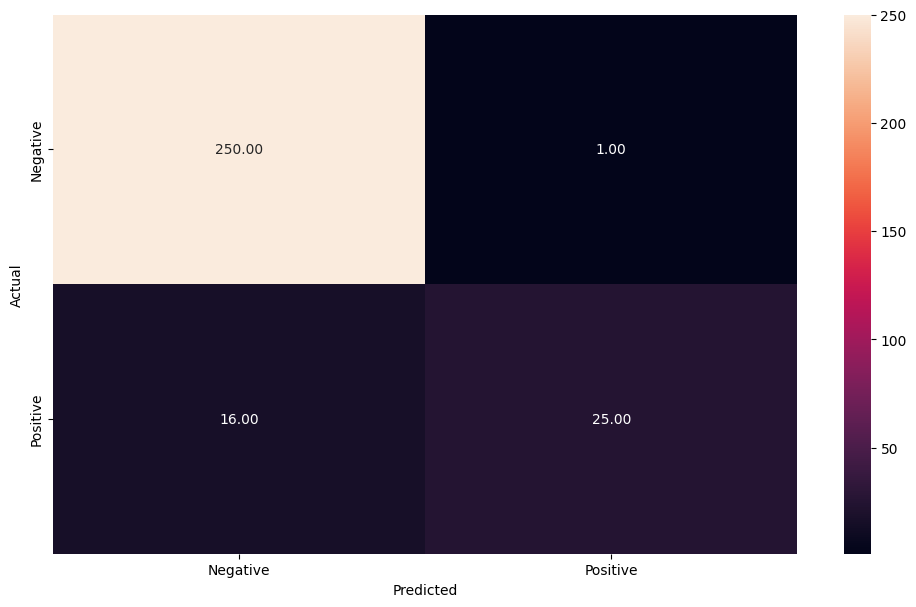

In [108]:
# Checking the performance on the training data

y_pred_train = lg.predict(X_train)
metrics_score(y_train, y_pred_train)

**Let's check the model performance**

**Reading the confusion matrix (clockwise):**

* True Negative (Actual=0, Predicted=0): Model predicts that a patient is negative and the patient is negative in real too.

* False Positive (Actual=0, Predicted=1): Model predicts that a patient is positive but the patient's case came out as negative.
  
* False Negative (Actual=1, Predicted=0): Model predicts that a patient is negative but the patient's case came out as positive. 

* True Positive (Actual=1, Predicted=1): Model predicts that a patient is positive and patient's case came out as positive.

              precision    recall  f1-score   support

           0       0.94      0.98      0.96        63
           1       0.88      0.64      0.74        11

    accuracy                           0.93        74
   macro avg       0.91      0.81      0.85        74
weighted avg       0.93      0.93      0.93        74



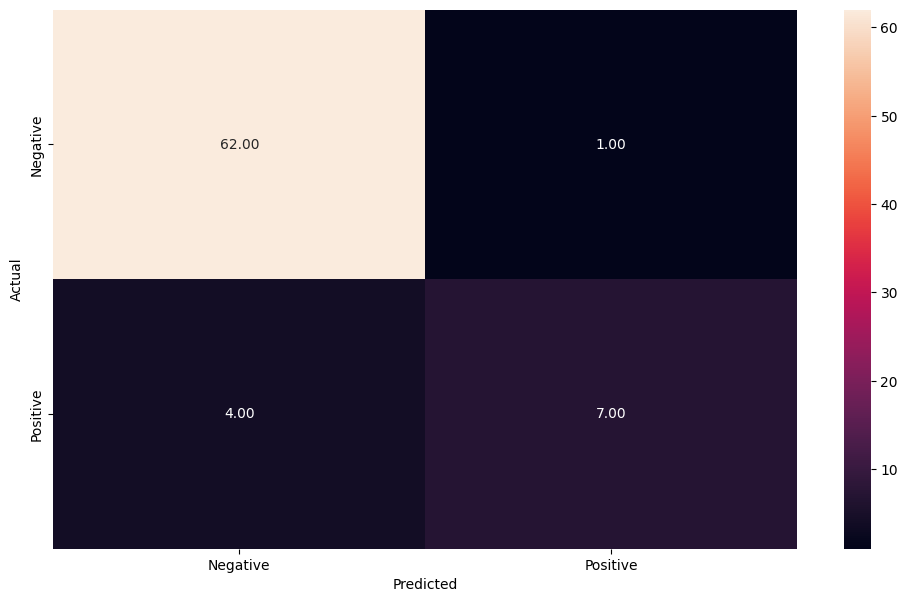

In [109]:
# Checking the performance on the test dataset
y_pred_test = lg.predict(X_test)
metrics_score(y_test, y_pred_test)

**Observations:**
- **We are getting an accuracy of around 93%** on train and test dataset.
- On the train and test datasets, however, **the recall** for this model is only about 64% for class 1.
- Due to the low recall, **this model will not perform well** in identifying individuals who have a high likelihood of testing positively for COVID. As a result, it will be difficult to predict if a patient will get COVID.

### Let's analyze the coefficients to determine which factors contribute to COVID's result

In [110]:
# Printing the coefficients of logistic regression

col=X_train.columns
coef_lg=lg.coef_
pd.DataFrame(coef_lg,columns=col).T.sort_values(by=0,ascending=False)

,0
"patient_addmited_to_regular_ward_(1=yes,_0=no)",1.484030
"patient_addmited_to_intensive_care_unit_(1=yes,_0=no)",1.317712
red_blood_cells,0.685060
"patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)",0.486058
monocytes,0.206649
corpuslar_add,0.129058
patient_age_quantile,0.036543
parainfluenza_1,0.000000
bordetella_pertussis,0.000000
chlamydophila_pneumoniae,0.000000


**Observations:**


**Features which positively affect on the COVID's positive case are:**
- patient_addmited_to_regular_ward_(1=yes,_0=no)	
- patient_addmited_to_intensive_care_unit_(1=yes,_0=no)	
- red_blood_cells
- patient_addmited_to_semi-intensive_unit_(1=yes,_0=no)
- monocytes
- corpuslar_add
- influenza_b,_rapid_test
- patient_age_quantile

**Features which negatively affect on the COVID's positive case are:**
- rhinovirus/enterovirus
- inf_a_h1n1_2009
- leukocytes
- influenza_b
- eosinophils	
- platelets
- influenza_a,_rapid_test
- parainfluenza_3
- coronavirusoc43	
- influenza_a
- coronavirus_hku1
- respiratory_syncytial_virus
- metapneumovirus	
- basophils
- red_blood_cell_distribution_width_(rdw)
- mean_corpuscular_hemoglobin_concentration (mchc)
- lymphocytes
- coronavirus229e
- coronavirusnl63
- mean_platelet_volume_
- adenovirus
- parainfluenza_4


### chlamydophila_pneumoniae,bordetella_pertussis and chlamydophila_pneumoniae are almost zero.


**Observations:**

- Based on the Logistic Regression model, patient_addmited_to_regular_ward_(1=yes,_0=no), patient_addmited_to_intensive_care_unit_(1=yes,_0=no), red_blood_cells and patient_addmited_to_semi-intensive_unit_(1=yes,_0=no) are positive important features in detecting whether patient's test will come as positive or not. As an example, Higher red_blood_cells leads to positive covid case.

#### **Precision-Recall Curve for logistic regression**
#### The trade-off between the true positive rate and the positive predictive value for a predictive model employing various probability thresholds is summarized by precision-recall curves

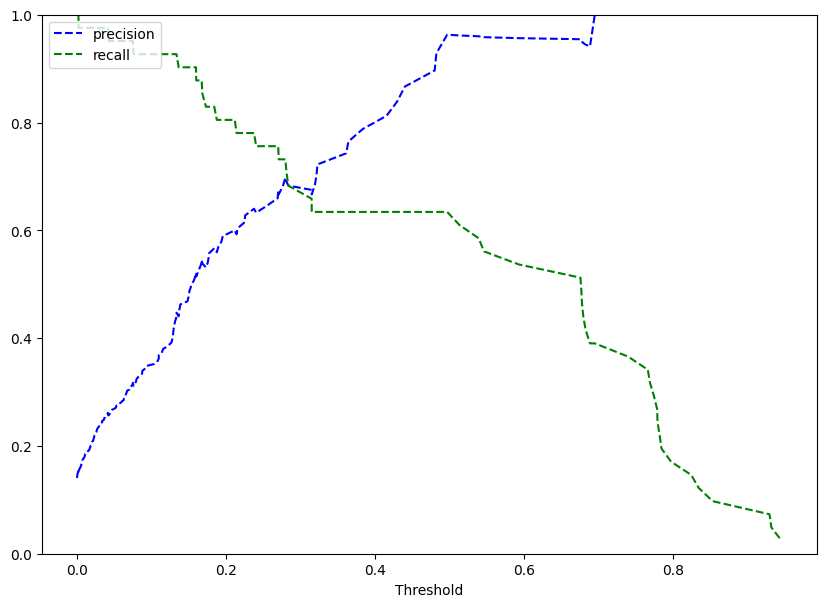

In [111]:
# Predict_proba gives the probability of each observation belonging to each class
y_scores_lg=lg.predict_proba(X_train)
precisions_lg, recalls_lg, thresholds_lg = precision_recall_curve(y_train, y_scores_lg[:,1])

# Plot values of precisions, recalls, and thresholds
plt.figure(figsize=(10,7))
plt.plot(thresholds_lg, precisions_lg[:-1], 'b--', label='precision')
plt.plot(thresholds_lg, recalls_lg[:-1], 'g--', label = 'recall')
plt.xlabel('Threshold')
plt.legend(loc='upper left')
plt.ylim([0,1])
plt.show()

In [112]:
# Calculating the exact threshold where precision and recall are equal.
for i in np.arange(len(thresholds_lg)):
    if precisions_lg[i]>recalls_lg[i]:
        print(thresholds_lg[i])
        break

0.3152350419166796


**Observation:**
- We can see that precision and recall are balanced for a threshold of about ~**0.3133**.

**Let's find out the performance of the model at this threshold**

              precision    recall  f1-score   support

           0       0.94      0.95      0.94       251
           1       0.67      0.63      0.65        41

    accuracy                           0.90       292
   macro avg       0.80      0.79      0.80       292
weighted avg       0.90      0.90      0.90       292



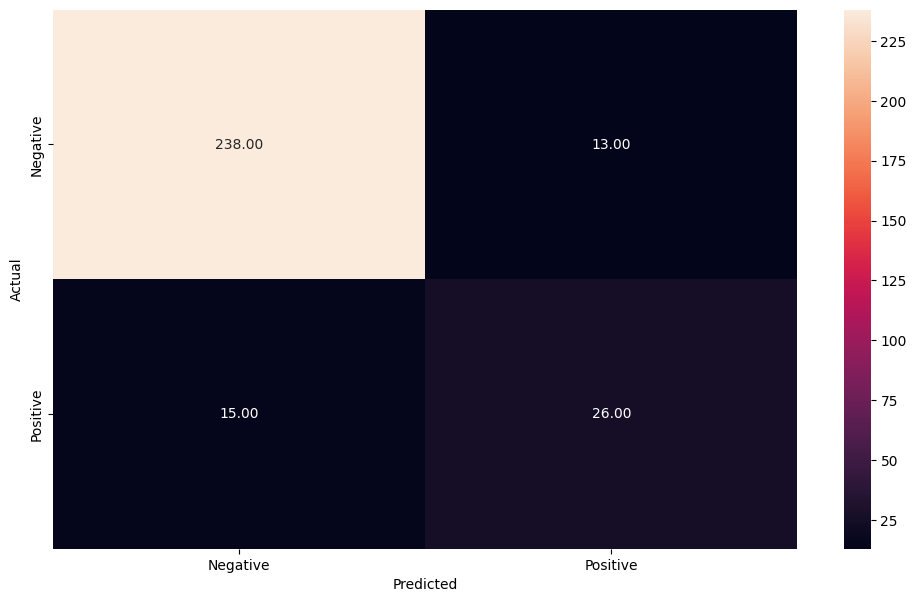

In [113]:
optimal_threshold=thresholds_lg[i]
y_pred_train = lg.predict_proba(X_train)
metrics_score(y_train, y_pred_train[:,1]>optimal_threshold)

**Observations:**
- The model performance has slighlty improved. The recall has increased significantly for class 1.
**Let's check the performance on the test data.**

              precision    recall  f1-score   support

           0       0.97      0.97      0.97        63
           1       0.82      0.82      0.82        11

    accuracy                           0.95        74
   macro avg       0.89      0.89      0.89        74
weighted avg       0.95      0.95      0.95        74



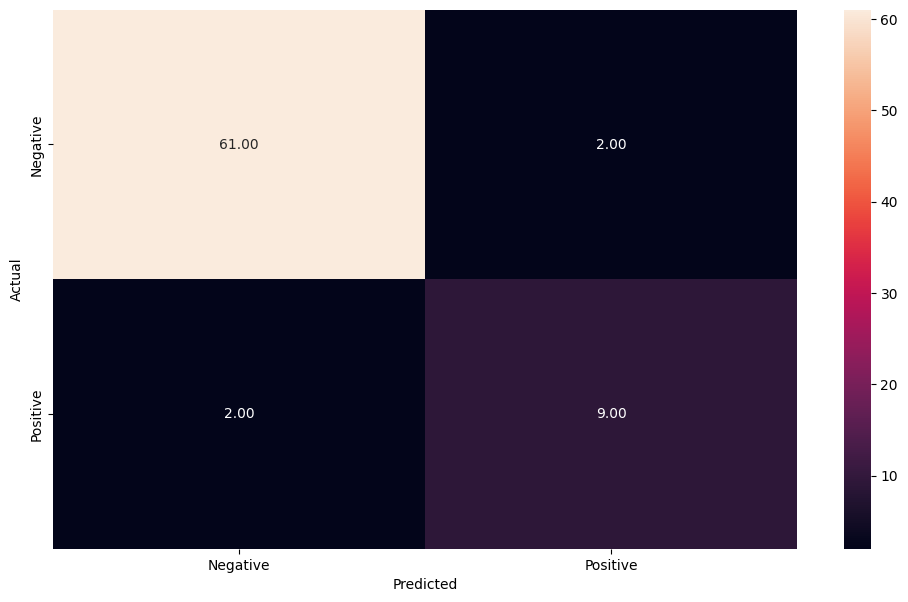

In [114]:
y_pred_test = lg.predict_proba(X_test)
metrics_score(y_test, y_pred_test[:,1]>optimal_threshold)

**Observations:**
- The model performance has improved. The recall has increased significantly for class 1 from 0.66 to 0.82. However, its being much higher than training's model performance is questinable!

## **Conclusions:**
- We have tried multiple models and identified the key factors involved with covid's positive and negative cases.
- Of all the models, logistic regression had the best performance. The results of train and test data, however, differ significantly. 
This raises some questions about the model's performance. 